## 科比生涯数据集分析

##### 数据类型简介


| 字段名              | 说明                             | 字段名             | 说明                             |
|---------------------|----------------------------------|--------------------|----------------------------------|
| action_type         | 投篮方式                         | shot_zone_area     | 调投篮的横向位置和大致区域，例如左侧、右侧、中间            |
| combined_shot_type  | 结合投篮方式 （更加概括）                    | shot_zone_basic    | 强调投篮的具体区域，例如受限区、三分线内外            |
| game_event_id       | 比赛事件ID                       | shot_zone_range    | 强调投篮距离            |
| game_id             | 比赛ID                           | team_id            | 队伍ID                           |
| lat                 | 投篮经度                         | team_name          | 队伍名字                         |
| loc_x               | 投篮x坐标                        | game_date          | 比赛时间                         |
| loc_y               | 投篮y坐标                        | matchup            | 比赛双方队伍                     |
| lon                 | 投篮纬度                         | opponent           | 对手队伍名字                     |
| minutes_remaining   | 离比赛结束还剩多少分钟           | shot_id            | 镜头ID                           |
| period              | 第几场                           | playoffs           | 是不是季后赛                     |
| season              | 赛季                             | shot_made_flag     | 是否进球（目标tag）              |
| seconds_remaining   | 离比赛结束还剩多少秒             | shot_type          | 2分球还是3分球区域               |
| shot_distance       | 投篮时距篮筐距离                 |                    |                                  |


In [189]:
import csv 
import pandas as pd
data=pd.read_csv('./kobe_data.csv')
data.head(5)

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,Jump Shot,Jump Shot,10,20000012,33.9723,167,72,-118.1028,10,1,...,2PT Field Goal,Right Side(R),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,1
1,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,2
2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,1,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,3
3,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,1,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,4
4,Driving Dunk Shot,Dunk,155,20000012,34.0443,0,0,-118.2698,6,2,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,5


### step1 加载数据并且检查数据
1. 查看数据前几行: 了解数据的基本结构。
2. 数据类型信息: 查看各列的数据类型和非空值数量。
3. 基本统计信息: 查看数值列的基本统计信息，如均值、标准差等。

In [190]:
# 查看数据前几行
print(data.head())
# 数据类型信息
print(data.info())
# 基本统计信息
print(data.describe())
# 缺失值统计
print(data.isnull().sum())
##重复值统计
print(len(data[data.duplicated()]))

         action_type combined_shot_type  game_event_id   game_id      lat  \
0          Jump Shot          Jump Shot             10  20000012  33.9723   
1          Jump Shot          Jump Shot             12  20000012  34.0443   
2          Jump Shot          Jump Shot             35  20000012  33.9093   
3          Jump Shot          Jump Shot             43  20000012  33.8693   
4  Driving Dunk Shot               Dunk            155  20000012  34.0443   

   loc_x  loc_y       lon  minutes_remaining  period  ...       shot_type  \
0    167     72 -118.1028                 10       1  ...  2PT Field Goal   
1   -157      0 -118.4268                 10       1  ...  2PT Field Goal   
2   -101    135 -118.3708                  7       1  ...  2PT Field Goal   
3    138    175 -118.1318                  6       1  ...  2PT Field Goal   
4      0      0 -118.2698                  6       2  ...  2PT Field Goal   

          shot_zone_area  shot_zone_basic  shot_zone_range     team_id  \


#### 第一步结论
##### 数据集段表
   
| Column Name         | Non-Null Count | Dtype     | 是否是分类变量 | 最小值        | 最大值        | 平均值        |
|---------------------|----------------|-----------|----------------|--------------|--------------|--------------|
| action_type         | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| combined_shot_type  | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| game_event_id       | 30697          | int64     | No             | 2            | 659          | 249.19       |
| game_id             | 30697          | int64     | No             | 20000001     | 49900009     | 24764067     |
| lat                 | 30697          | float64   | No             | 33.2533      | 34.0883      | 33.9532      |
| loc_x               | 30697          | int64     | No             | -250         | 248          | 7.11         |
| loc_y               | 30697          | int64     | No             | -44          | 791          | 91.11        |
| lon                 | 30697          | float64   | No             | -118.5198    | -118.0218    | -118.2627    |
| minutes_remaining   | 30697          | int64     | No             | 0            | 11           | 4.89         |
| period              | 30697          | int64     | Yes            | 1            | 7            | 2.52         |
| playoffs            | 30697          | int64     | Yes            | 0            | 1            | 0.15         |
| season              | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| seconds_remaining   | 30697          | int64     | No             | 0            | 59           | 28.37        |
| shot_distance       | 30697          | int64     | No             | 0            | 79           | 13.44        |
| shot_made_flag      | 25697          | float64   | No             | 0            | 1            | 0.45         |
| shot_type           | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| shot_zone_area      | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| shot_zone_basic     | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| shot_zone_range     | 30697          | object    | Yes            | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| team_id             | 30697          | int64     | No             | 1610612747   | 1610612747   | 1610612747   |
| team_name           | 30697          | object    | No             | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| game_date           | 30697          | object    | No             | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| matchup             | 30697          | object    | No             | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| opponent            | 30697          | object    | No             | 详见具体数据   | 详见具体数据   | 详见具体数据   |
| shot_id             | 30697          | int64     | No             | 1            | 30697        | 15349        |


##### 数据的缺失值
| Column Name         | Null Count |
|---------------------|----------------|
| shot_made_fla         | 5000          |

###  step2 数据清洗
1. 缺失值、重复值统计: 检查每列中缺失值、重复值的数量。
2. 异常数据发现：不合理的数据

### Process step 1 数据重复、缺失、异常值处理
处理完---〉dataset shape (25695, 25)

In [191]:
# 删除重复值
data_cleaned = data.drop_duplicates()
# 删除含有缺失值的行
data_cleaned = data_cleaned.dropna()
# 显示处理后的数据基本信息
print(data_cleaned.info())
# 显示前几行数据
print(data_cleaned.head())
data_cleaned.to_csv('./kobe_data_dpna.csv') ##(25697, 25)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25697 entries, 1 to 30696
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   action_type         25697 non-null  object 
 1   combined_shot_type  25697 non-null  object 
 2   game_event_id       25697 non-null  int64  
 3   game_id             25697 non-null  int64  
 4   lat                 25697 non-null  float64
 5   loc_x               25697 non-null  int64  
 6   loc_y               25697 non-null  int64  
 7   lon                 25697 non-null  float64
 8   minutes_remaining   25697 non-null  int64  
 9   period              25697 non-null  int64  
 10  playoffs            25697 non-null  int64  
 11  season              25697 non-null  object 
 12  seconds_remaining   25697 non-null  int64  
 13  shot_distance       25697 non-null  int64  
 14  shot_made_flag      25697 non-null  float64
 15  shot_type           25697 non-null  object 
 16  shot

####  异常值处理
我们查阅了很多网站，发现了三分球距离的规定，肯定是大于22inches的
1. Wikipedia: "In the NBA, the distance of the three-point line is 23 feet 9 inches at the top of the key and 22 feet in the corners." - Three-point field goal - Wikipedia​ (Wikipedia)​.

2. The Hoops Geek: "The three-point line in the NBA is 23'9" at the top of the key and 22' at the corners." - Basketball Court Dimensions - Diagrams & Measurements​ (The Hoops Geek)​.

3. Dunk or Three: "At a maximum distance, the NBA three-point line is 23 feet 9 inches from the basket. Its minimum distance from the basket to the nearest sideline, on each side, is 22 feet." - NBA 3-point Line: Everything You Need to Know​ (Dunk Or Three)​.

In [192]:
# 删除明显异常的三分球记录 
data_cleaned_error = data_cleaned[~((data_cleaned['shot_type'] == '3PT Field Goal') & (data_cleaned['shot_distance'] < 22))]
data_cleaned_error.to_csv('./kobe_data_dpna_errors.csv') ###(25695, 25)

In [193]:
import pandas as pd
data_cleaned_error=pd.read_csv('./kobe_data_dpna_errors.csv')

####  确定是否有离群值

nba篮球场长94英尺，宽50英尺，其中loc_x和loc_y分别等于0时候代表篮筐中心（比例尺1:10），然后篮筐距离底线5.3英尺。也就是说loc_x的范围是从-250-250，loc_y的范围是从-53-887,所以说下面这些点不算**离群点或者说异常点**

In [194]:
data_cleaned_error

,Unnamed: 0,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,1,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,2
1,2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,3
2,3,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,4
3,4,Driving Dunk Shot,Dunk,155,20000012,34.0443,0,0,-118.2698,6,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,5
4,5,Jump Shot,Jump Shot,244,20000012,34.0553,-145,-11,-118.4148,9,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25690,30691,Driving Layup Shot,Layup,382,49900088,34.0443,0,0,-118.2698,7,...,2PT Field Goal,Center(C),Restricted Area,Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30692
25691,30692,Jump Shot,Jump Shot,397,49900088,33.9963,1,48,-118.2688,6,...,2PT Field Goal,Center(C),In The Paint (Non-RA),Less Than 8 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30693
25692,30694,Running Jump Shot,Jump Shot,426,49900088,33.8783,-134,166,-118.4038,3,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30695
25693,30695,Jump Shot,Jump Shot,448,49900088,33.7773,31,267,-118.2388,2,...,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30696


/var/folders/yw/471j94rd1tl3h5hyf3ht9k480000gn/T/ipykernel_4476/56731051.py:6: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



              loc_x         loc_y  shot_distance  minutes_remaining  \
count  25695.000000  25695.000000   25695.000000       25695.000000   
mean       7.145593     91.262892      13.457793           4.886787   
std      110.076294     88.153119       9.388674           3.452598   
min     -250.000000    -44.000000       0.000000           0.000000   
25%      -67.500000      4.000000       5.000000           2.000000   
50%        0.000000     74.000000      15.000000           5.000000   
75%       94.000000    160.000000      21.000000           8.000000   
max      248.000000    791.000000      79.000000          11.000000   

       seconds_remaining  
count       25695.000000  
mean           28.312318  
std            17.523326  
min             0.000000  
25%            13.000000  
50%            28.000000  
75%            43.000000  
max            59.000000  


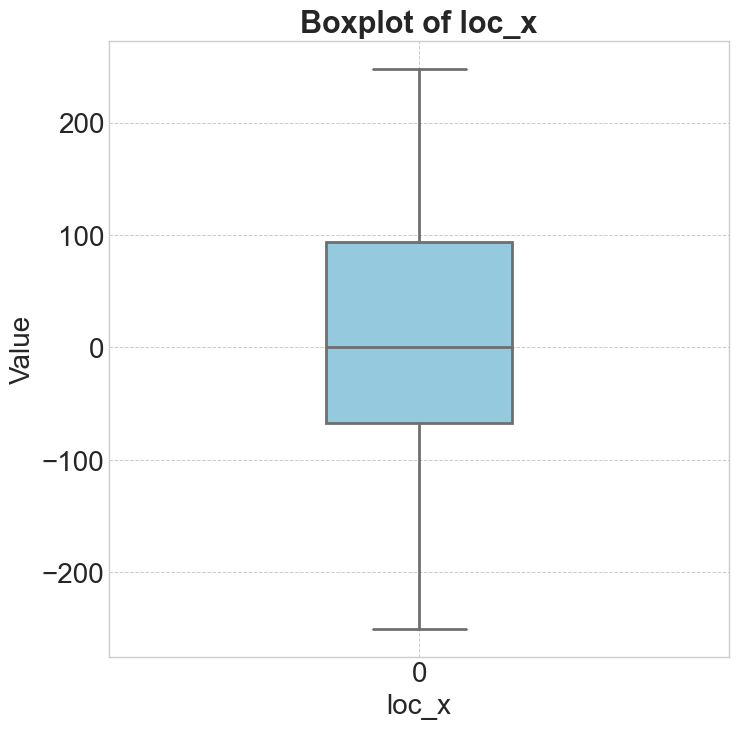

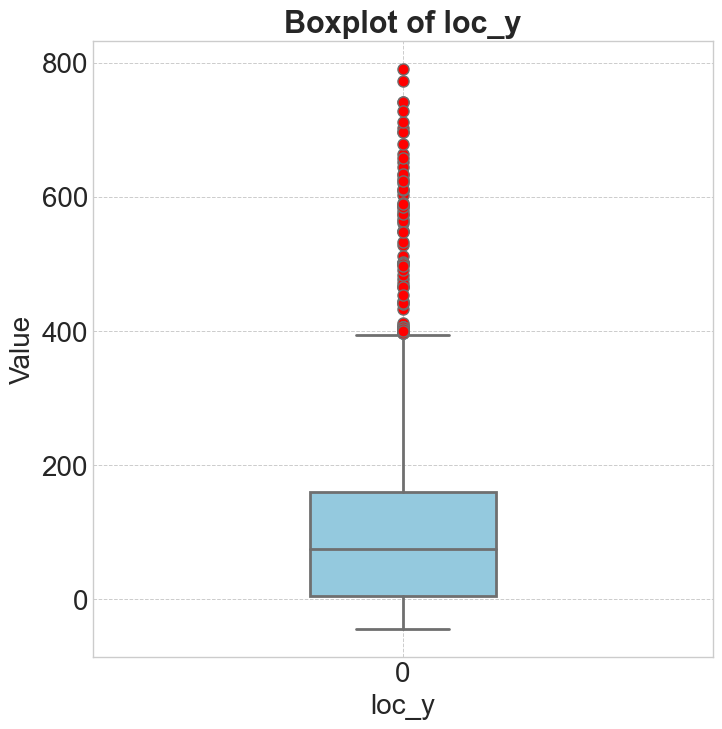

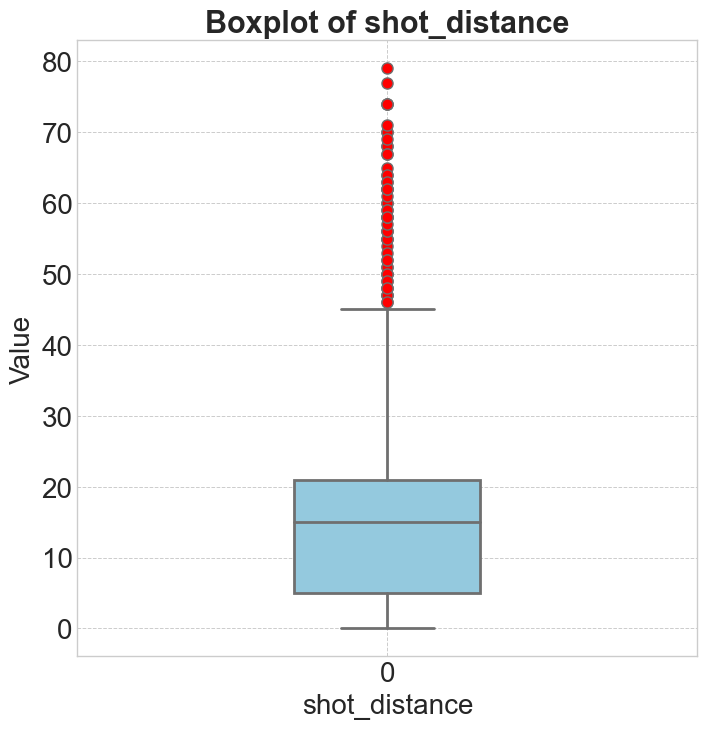

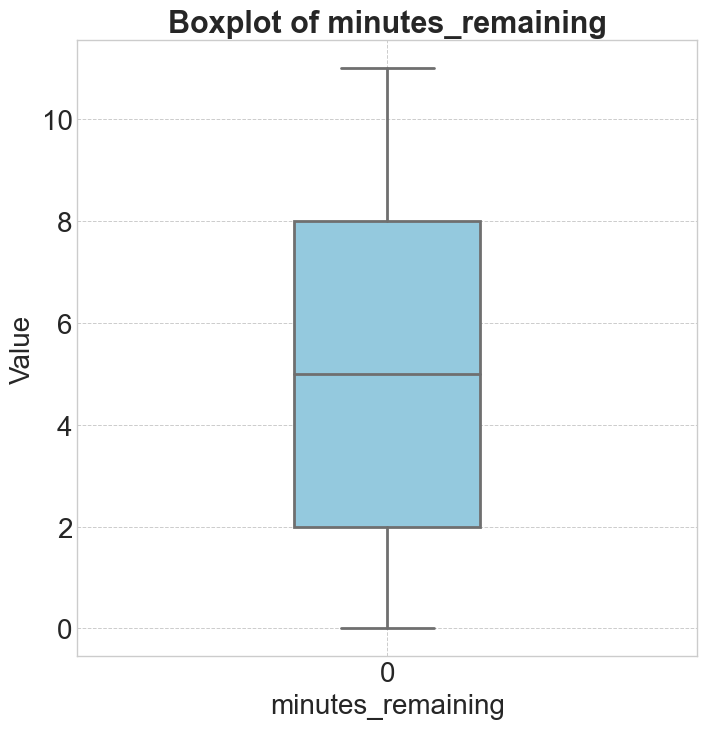

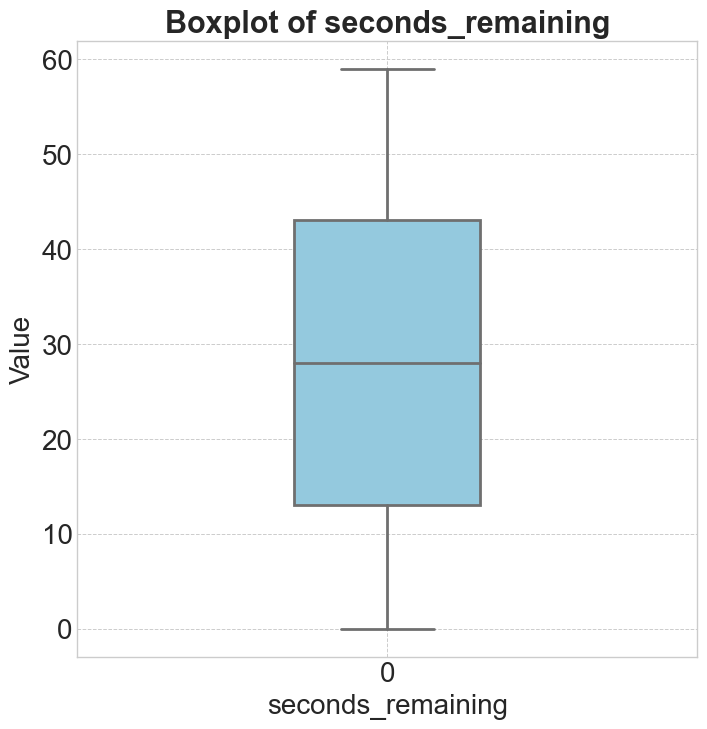

In [195]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 设置绘图风格为 'seaborn-whitegrid'
plt.style.use('seaborn-whitegrid')

# 使用箱线图识别数值字段的离群值
numeric_fields = ['loc_x', 'loc_y', 'shot_distance', 'minutes_remaining', 'seconds_remaining']
for field in numeric_fields:
    plt.figure(figsize=(8, 8))
    sns.boxplot(data=data_cleaned_error[field], color='skyblue', width=0.3,
                fliersize=7, linewidth=2, 
                flierprops={'markerfacecolor': 'red', 'marker': 'o', 'markersize': 8})
    plt.title(f'Boxplot of {field}', fontsize=22, weight='bold')
    plt.xlabel(field, fontsize=20)
    plt.ylabel('Value', fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.grid(True, linestyle='--', linewidth=0.7)
    plt.savefig(r'/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/'+field+'.png',dpi=800,transparent=True)
    # plt.show()

# 描述性统计
print(data_cleaned_error[numeric_fields].describe())


### step3 数据转化
1. 数据标准化
2. 数据转化

In [196]:
data_cleaned_error['season']


0        2000-01
1        2000-01
2        2000-01
3        2000-01
4        2000-01
          ...   
25690    1999-00
25691    1999-00
25692    1999-00
25693    1999-00
25694    1999-00
Name: season, Length: 25695, dtype: object

### step4 数据分析

#### 分析投篮类型的分布
1. overall投篮占比和数量

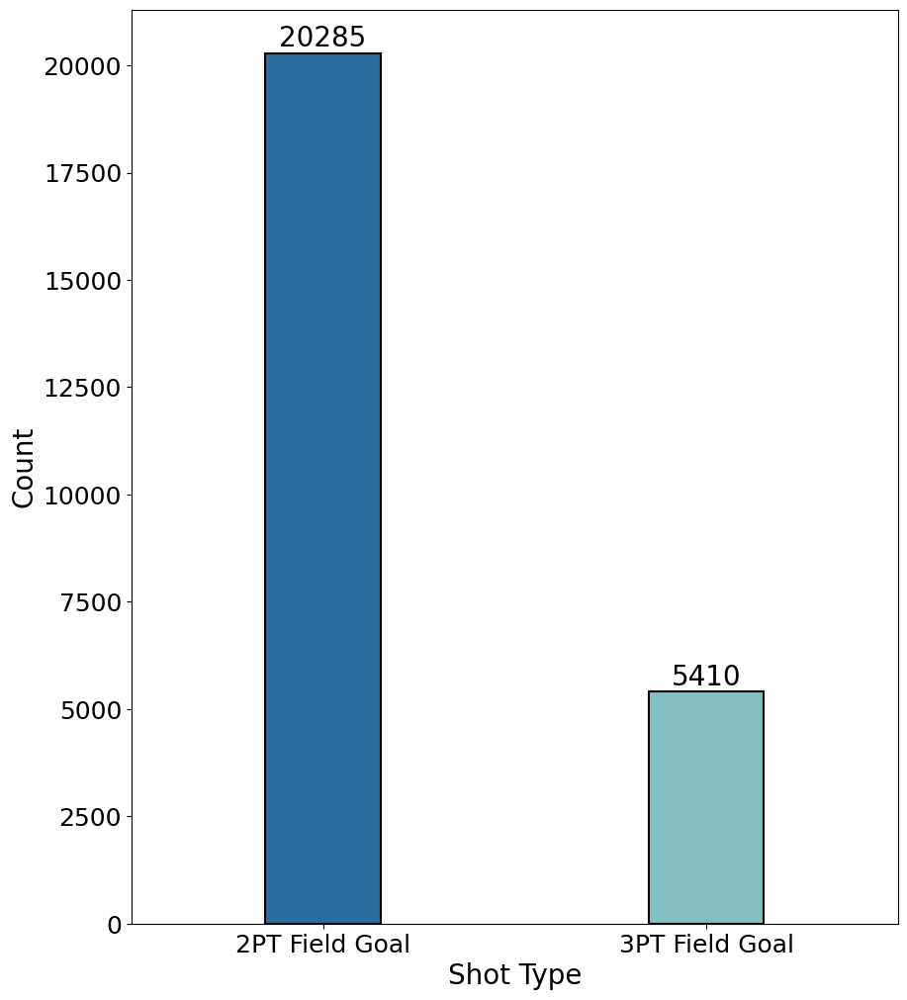

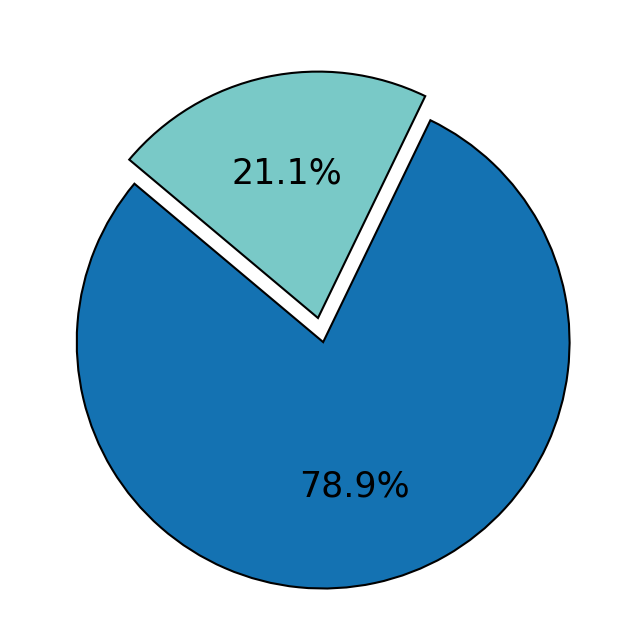

In [4]:
root='/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮类型的分布/'
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# # 读取数据文件
file_path = '/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv'
data_cleaned_error = pd.read_csv(file_path)

# 删除重复值和缺失值
data_cleaned_error = data_cleaned_error.drop_duplicates()
data_cleaned_error = data_cleaned_error.dropna()

# 设置绘图风格为 'seaborn-whitegrid'
# plt.style.use('seaborn-whitegrid')

# 统计投篮类型的频次
shot_type_counts = data_cleaned_error['shot_type'].value_counts()

# 绘制条形图
plt.figure(figsize=(10, 12))
ax=sns.countplot(x='shot_type', data=data_cleaned_error, palette=['#1472B2', '#79C9C7'],width=0.3)
# plt.title('Distribution of Shot Types', fontsize=22, weight='bold')
plt.xlabel('Shot Type', fontsize=20)
plt.ylabel('Count', fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
# plt.grid(True, linestyle='--', linewidth=0.7)
for index, value in enumerate(shot_type_counts):
    plt.text(index, value + 150, str(value), ha='center', fontsize=20)
# 给每个柱子加上边框
for patch in ax.patches:
    patch.set_edgecolor('black')
    patch.set_linewidth(1.5)
ax.grid(False)  # 移除所有网格线
plt.savefig('./image/投篮类型的分布/2.png',dpi=1000,transparent=True)
plt.show()

# 绘制饼图
colors = ['#1472B2', '#79C9C7']
plt.figure(figsize=(12, 8))
wedges, texts, autotexts = plt.pie(shot_type_counts,  autopct='%1.1f%%', colors=colors,
                                   textprops={'fontsize': 25}, startangle=140, explode=(0.1, 0))
# plt.title('Distribution of Shot Types', fontsize=22, weight='bold')
# 给每个饼图部分加上边框
for wedge in wedges:
    wedge.set_edgecolor('black')
    wedge.set_linewidth(1.5)
plt.savefig('./image/投篮类型的分布/1.png',dpi=1000,transparent=True)
plt.show()

#####  分析不同投篮类型与赛季season的关系
- 2022年10月19日–2023年4月10日（常规赛）
- 2023年4月12日–4月15日（季后附加赛）
- 2023年4月16日–5月30日（季后赛）
- 2023年6月2日—6月13日（总冠军赛)

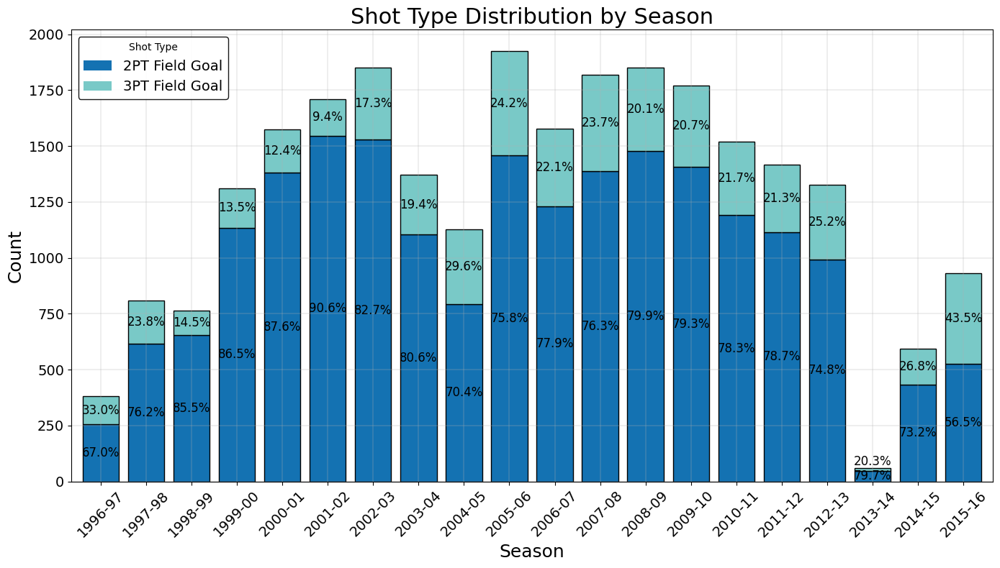

In [198]:
import matplotlib.pyplot as plt
import seaborn as sns
# 统计各赛季的投篮类型分布
season_shot_type = data_cleaned_error.groupby(['season', 'shot_type']).size().unstack().fillna(0)
# 设置绘图风格
plt.style.use('default')

# 可视化分析：堆积柱状图
fig, ax = plt.subplots(figsize=(14, 8))
# season_shot_type.plot(kind='bar', stacked=True, figsize=(14, 8), color=['#1472B2', '#79C9C7'], width=0.8,ax=ax)
bars = season_shot_type.plot(kind='bar', stacked=True, figsize=(14, 8), color=['#1472B2', '#79C9C7'], ax=ax, width=0.8)
# 标题和标签
plt.title('Shot Type Distribution by Season', fontsize=22)
plt.xlabel('Season', fontsize=18)
plt.ylabel('Count', fontsize=18)
plt.xticks(rotation=45, fontsize=14)
plt.yticks(fontsize=14)
plt.legend(title='Shot Type', fontsize=14)
plt.grid(True, linestyle='-', linewidth=0.3)

# 添加边框和调整图例位置
plt.legend(title='Shot Type', fontsize=14, loc='upper left', frameon=True, framealpha=0.9, edgecolor='black')

# 在柱子上添加百分比标注
for i in range(season_shot_type.shape[0]):
    total = season_shot_type.iloc[i].sum()
    cumulative = 0
    for j in range(season_shot_type.shape[1]):
        height = season_shot_type.iloc[i, j]
        percentage = height / total * 100
        cumulative += height
        if height > 20:  # 如果柱子高度大于20，标注在柱子内
            ax.text(i, cumulative - height / 2, f'{percentage:.1f}%', ha='center', va='center', fontsize=12, color='black')
        else:  # 如果柱子高度较小，标注在柱子上方
            ax.text(i, cumulative + height / 10, f'{percentage:.1f}%', ha='center', va='bottom', fontsize=12, color='black')
        # ax.text(i, cumulative - height / 2, f'{percentage:.1f}%', ha='center', va='center', fontsize=12, color='black')
for container in bars.containers:
    for patch in container:
        patch.set_edgecolor('black')
        patch.set_linewidth(1)
plt.tight_layout()
plt.savefig('Seasonadtype.png',dpi=1000,transparent=True)
# plt.show()

#### 分析投篮类型与节的关系




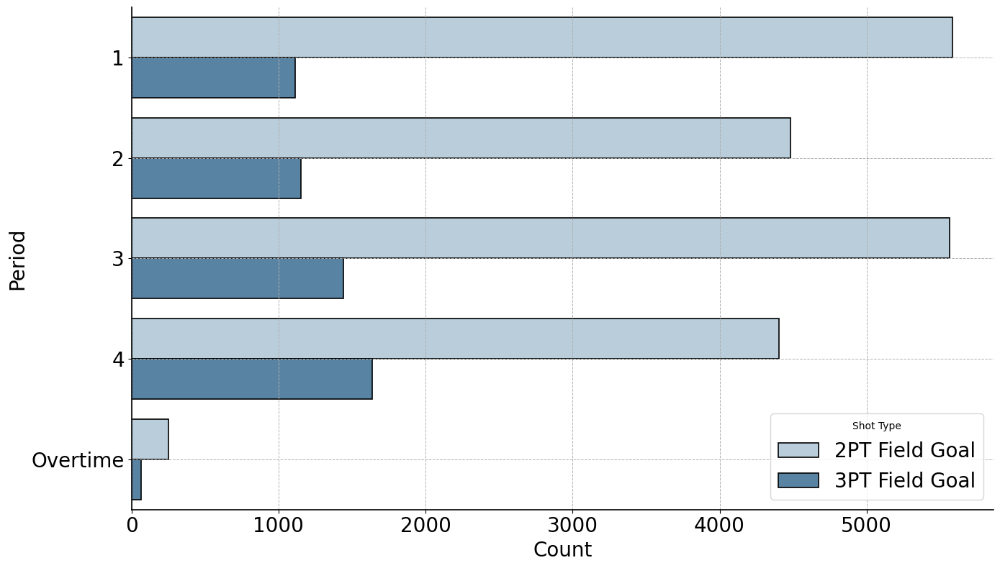

In [5]:
df=data_cleaned_error
df['period'] = df['period'].replace([5, 6, 7], 'Overtime')
# 统计不同 Period 中的投篮类型分布
period_shot_type = df.groupby(['period', 'shot_type']).size().unstack().fillna(0)
# 可视化分析：分组条形图

# 可视化分析：分组条形图（横向显示）
plt.figure(figsize=(14, 8))
ax = sns.countplot(y='period', hue='shot_type', data=data_cleaned_error, palette=['#B3CEE0', '#4B85AF'])

# 为每个柱状图添加边框
for patch in ax.patches:
    patch.set_edgecolor('black')
    patch.set_linewidth(1.2)

# plt.title('Shot Type Distribution by Period', fontsize=22, weight='bold')
plt.xlabel('Count', fontsize=20)
plt.ylabel('Period', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(title='Shot Type', fontsize=20)
plt.grid(True, linestyle='--', linewidth=0.7)

# 增加边框线条
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.2)
plt.gca().spines['bottom'].set_linewidth(1.2)
plt.tight_layout()
plt.savefig('./image/投篮类型的分布/Period.png',dpi=1000,transparent=True)
plt.show()

#### 分析投篮类型与是否命中

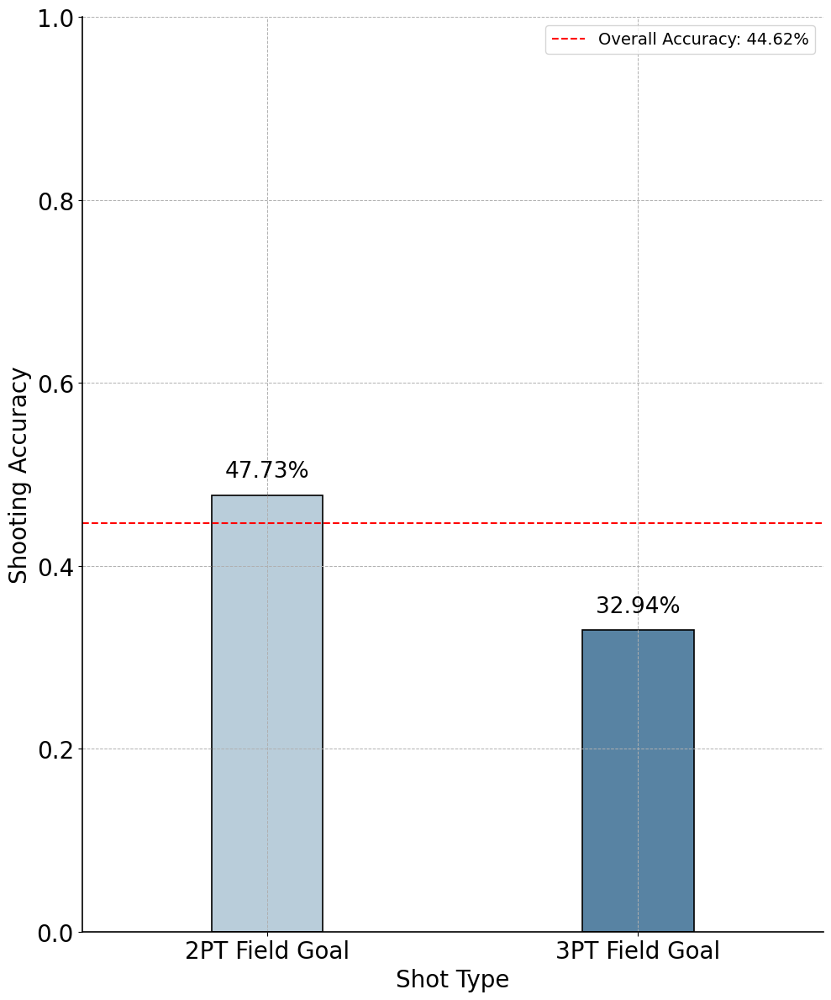

In [10]:
# 计算不同投篮类型的命中率
shot_type_accuracy = data_cleaned_error.groupby('shot_type')['shot_made_flag'].mean()

# 计算总命中率
overall_accuracy = data_cleaned_error['shot_made_flag'].mean()

# 可视化分析：投篮类型命中率条形图
plt.figure(figsize=(10, 12))
ax = sns.barplot(x=shot_type_accuracy.index, y=shot_type_accuracy.values, palette=['#B3CEE0', '#4B85AF'], width=0.3)

# 为每个柱状图添加边框
for patch in ax.patches:
    patch.set_edgecolor('black')
    patch.set_linewidth(1.2)

# 添加命中率标注
for i, value in enumerate(shot_type_accuracy.values):
    ax.text(i, value + 0.02, f'{value:.2%}', ha='center', fontsize=19)

# 添加总命中率标注
plt.axhline(overall_accuracy, color='red', linestyle='--', linewidth=1.5, label=f'Overall Accuracy: {overall_accuracy:.2%}')
plt.legend(loc='upper right', fontsize=14)

# plt.title('Shooting Accuracy by Shot Type', fontsize=22)
plt.xlabel('Shot Type', fontsize=20)
plt.ylabel('Shooting Accuracy', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.ylim(0, 1)
plt.grid(True, linestyle='--', linewidth=0.7)

# 增加边框线条
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.2)
plt.gca().spines['bottom'].set_linewidth(1.2)
plt.tight_layout()
plt.savefig('./image/投篮类型的分布/ShootingAccuracy.png',dpi=1000,transparent=True)
plt.show()

### 季后赛和常规赛中的投篮类型分布 场均投篮类型分布

In [201]:
playoff_shot_type_game_counts = df.groupby(['playoffs', 'shot_type', 'game_id']).size().unstack().fillna(0)
playoff_shot_type_game_avg = playoff_shot_type_game_counts.groupby(['playoffs', 'shot_type']).mean()
playoff_shot_type_game_avg.to_csv('sss.csv')

In [202]:
playoff_shot_type_game_counts = df.groupby(['playoffs', 'shot_type', 'game_id']).size().unstack().fillna(0)

# 计算场均投篮类型分布
playoff_shot_type_game_avg = playoff_shot_type_game_counts.mean(axis=1)
playoff_shot_type_game_avg

playoffs  shot_type     
0         2PT Field Goal    11.083440
          3PT Field Goal     2.996791
1         2PT Field Goal     1.936457
          3PT Field Goal     0.475610
dtype: float64

<Figure size 1200x800 with 0 Axes>

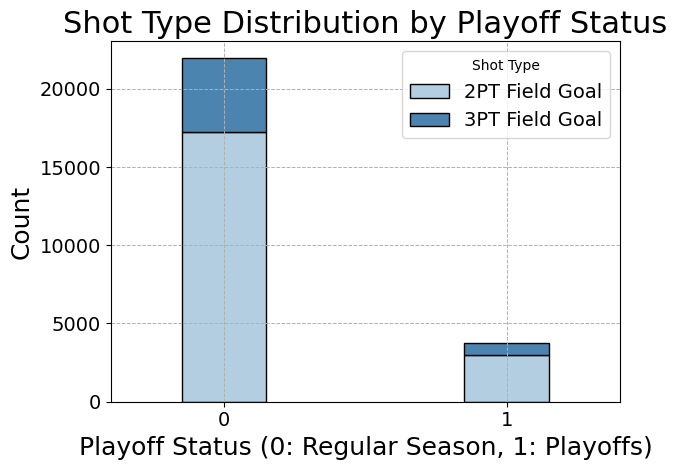

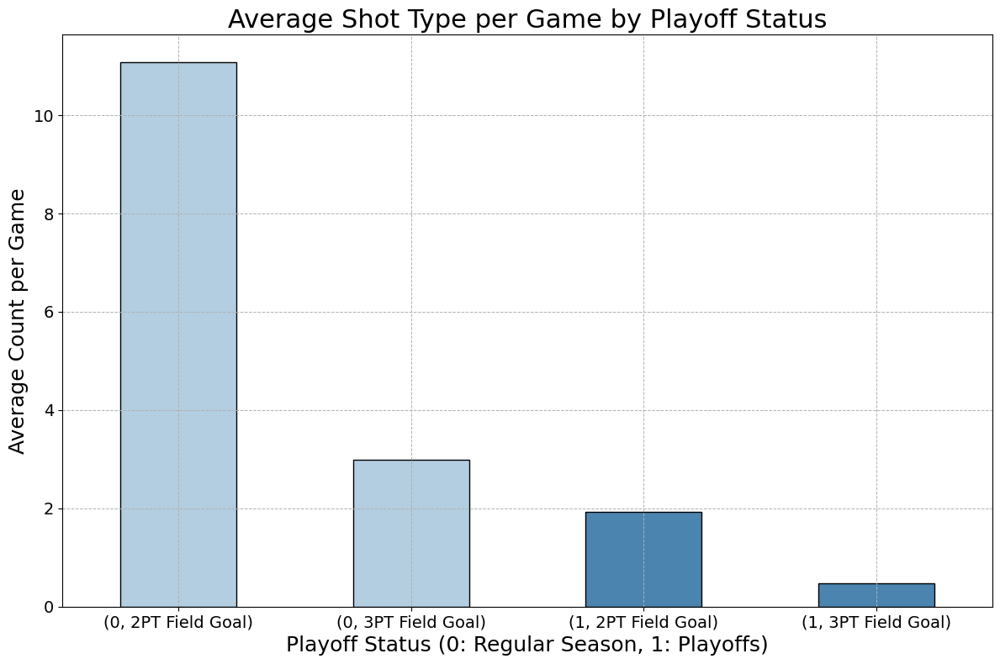

In [203]:
# 1. 以playoff和shot_type为分组分析关系
playoff_shot_type_counts = df.groupby(['playoffs', 'shot_type']).size().unstack().fillna(0)

# 可视化分析：季后赛和常规赛中的投篮类型分布
plt.figure(figsize=(12, 8))
playoff_shot_type_counts.plot(kind='bar', stacked=True, color=['#B3CEE0', '#4B85AF'], width=0.3, edgecolor='black')
plt.title('Shot Type Distribution by Playoff Status', fontsize=22)
plt.xlabel('Playoff Status (0: Regular Season, 1: Playoffs)', fontsize=18)
plt.ylabel('Count', fontsize=18)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14)
plt.legend(title='Shot Type', fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.7)
plt.tight_layout()
plt.savefig('./image/投篮类型的分布/Shootingandplayoff.png',dpi=800,transparent=True)
plt.show()

# 2. 以playoff、shot_type和game_id为分组分析季后赛和常规赛中的场均投篮类型分布
playoff_shot_type_game_counts = df.groupby(['playoffs', 'shot_type', 'game_id']).size().unstack().fillna(0)

# 计算场均投篮类型分布
playoff_shot_type_game_avg = playoff_shot_type_game_counts.mean(axis=1)

# 可视化分析：季后赛和常规赛中的场均投篮类型分布
plt.figure(figsize=(12, 8))
playoff_shot_type_game_avg.plot(kind='bar', stacked=True, color=['#B3CEE0', '#B3CEE0','#4B85AF','#4B85AF'], width=0.5, edgecolor='black')
plt.title('Average Shot Type per Game by Playoff Status', fontsize=22)
plt.xlabel('Playoff Status (0: Regular Season, 1: Playoffs)', fontsize=18)
plt.ylabel('Average Count per Game', fontsize=18)
plt.xticks(fontsize=14, rotation=0)
plt.yticks(fontsize=14)
# plt.legend(title='Shot Type', fontsize=14)
plt.grid(True, linestyle='--', linewidth=0.7)
plt.tight_layout()
plt.savefig('./image/投篮类型的分布/Shootingandplayoff_avg.png',dpi=800,transparent=True)
plt.show()

#### 分析投篮方式的分布

In [204]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# # 读取数据文件
file_path = '/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv'
data = pd.read_csv(file_path)

In [205]:
# Get the distribution of combined_shot_type
shot_type_distribution = data['combined_shot_type'].value_counts()
shot_type_distribution.to_csv('./ssss.csv')
shot_type_distribution

Jump Shot    19708
Layup         4532
Dunk          1056
Tip Shot       152
Hook Shot      127
Bank Shot      120
Name: combined_shot_type, dtype: int64

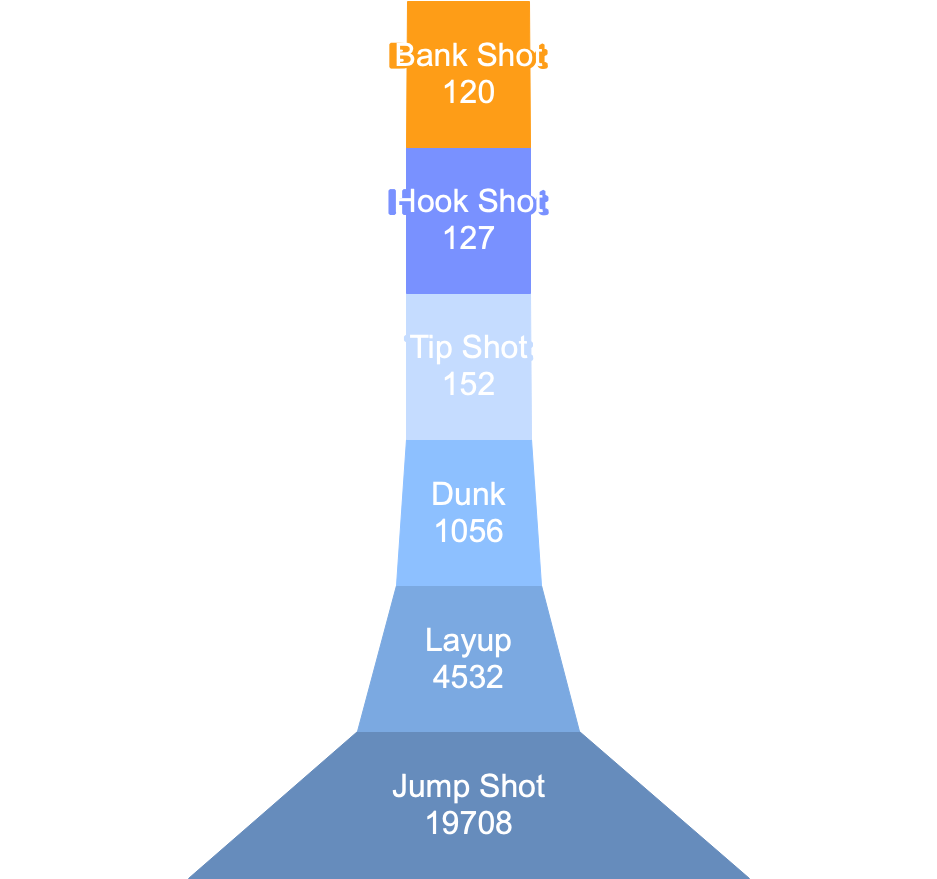

##### 分析投篮方式和结合投篮方式的具体分布，因为有一些actiontype的个数太少我们将其归纳为others类，具体的下面会说

##### 统计actiontype个数，导出到ac_co

In [206]:
shot_type_distribution = data.groupby(['combined_shot_type','action_type']).size()
shot_type_distribution=shot_type_distribution.reset_index('combined_shot_type')
shot_type_distribution.to_csv('ac_co.csv')

##### 设置others 类别具体的为：
1. dunk中的other类:  <br>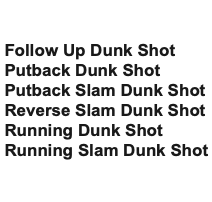 </br>
2. Layup中的Others类别： <br>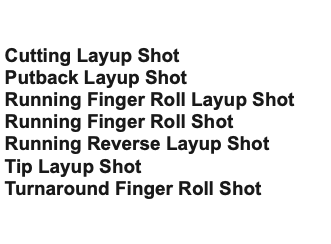
3. Jump Shot中的Others类:  <br>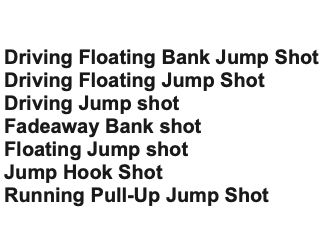

In [ ]:
shot_type_distribution=pd.read_csv('./ac_co.csv')
threshold = 20
# 创建新的一列
shot_type_distribution['new_combined_shot_type'] = shot_type_distribution.apply(
    lambda row: "Others" if row['count'] < threshold else row['action_type'],
    axis=1
)
shot_type_distribution.to_csv('../期末大作业/image/投篮方式分布/ac_co2.csv')

In [ ]:
# 计算被归类为 "Others" 的总数
others_count = shot_type_distribution[shot_type_distribution['new_combined_shot_type'] == "Others"]['count'].sum()

# 创建新的 DataFrame 来存储 "Others" 总数
others_data = pd.DataFrame({
    'action_type': ['Total Others'],
    'combined_shot_type': ['Others'],
    'count': [others_count],
    'new_combined_shot_type': ['Others']
})

# 将 "Others" 总数添加到原 DataFrame 的最后
df = pd.concat([shot_type_distribution, others_data], ignore_index=True)

In [ ]:
df=pd.read_csv('../期末大作业/image/投篮方式分布/ac_co2.csv')

In [ ]:
others_summary = df[df['new_combined_shot_type'] == "Others"].groupby('combined_shot_type')['count'].sum().reset_index()
others_summary

,combined_shot_type,count
0,Bank Shot,19.0
1,Dunk,49.0
2,Hook Shot,21.0
3,Jump Shot,168.0
4,Layup,35.0
5,Tip Shot,1.0


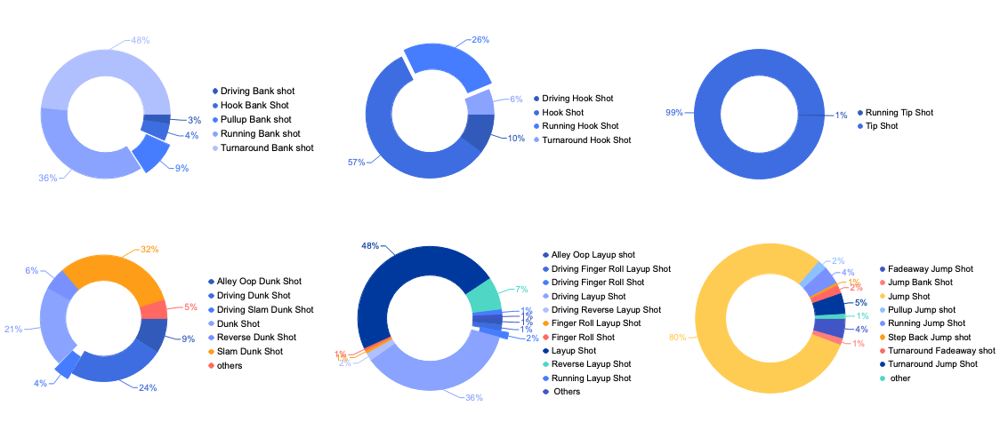

### 统计action_type和combinaction_type的进球率

In [ ]:
data=pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')

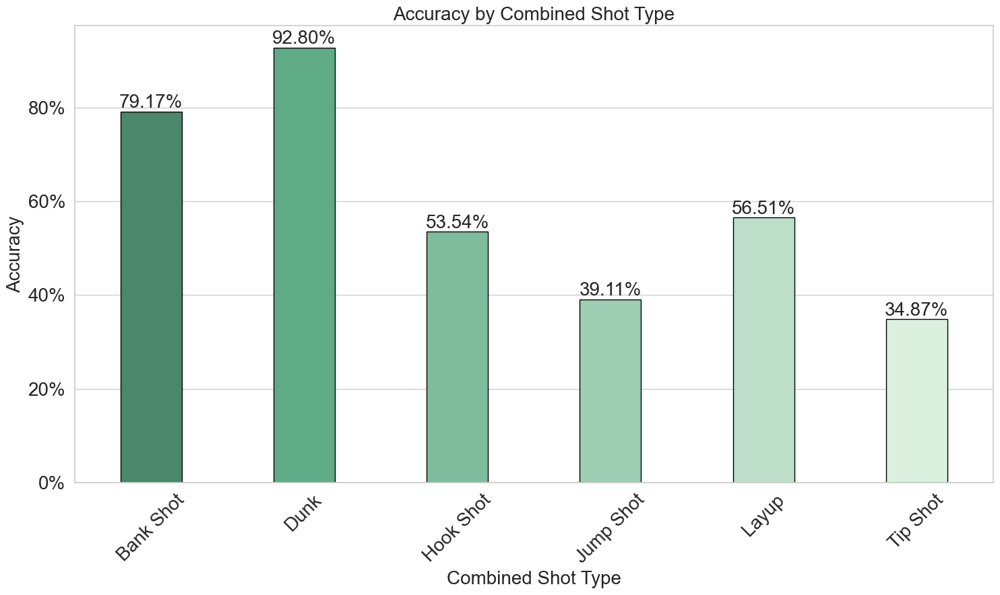

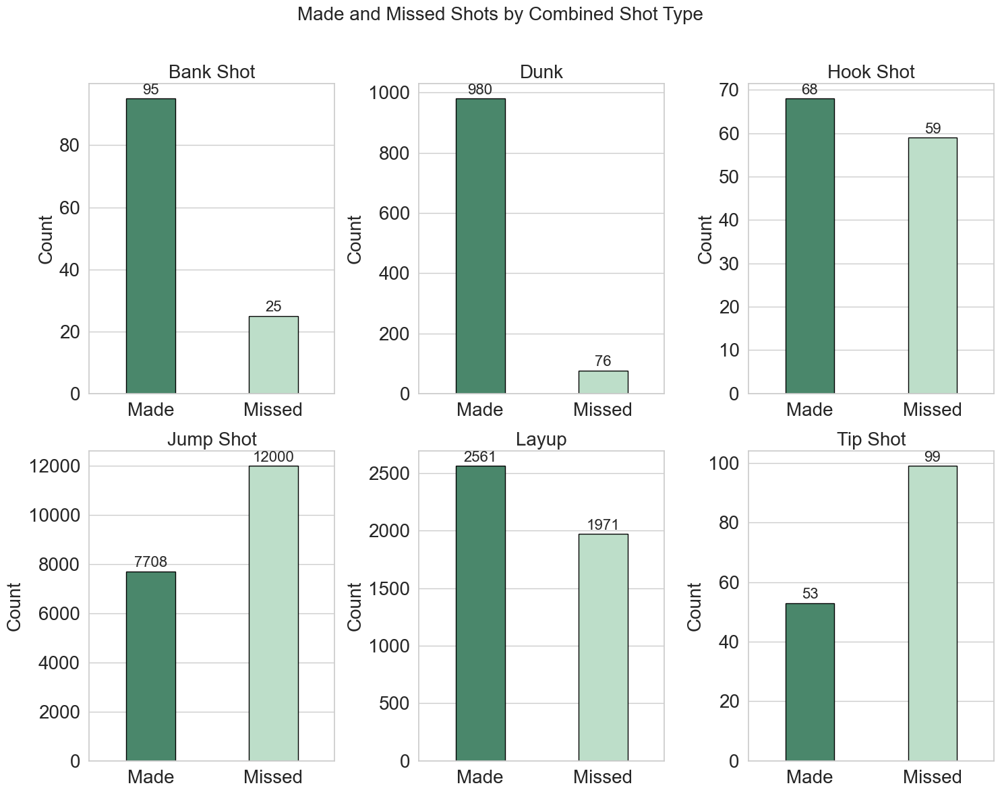

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# 数据加载
# 数据加载
df = pd.DataFrame(data)
# 计算每种 combined_shot_type 的进球数和未进球数
made_counts = df[df['shot_made_flag'] == 1]['combined_shot_type'].value_counts()
missed_counts = df[df['shot_made_flag'] == 0]['combined_shot_type'].value_counts()

# 合并进球数和未进球数
combined_counts = pd.DataFrame({'Made': made_counts, 'Missed': missed_counts}).fillna(0)

# 计算准确率
combined_counts['Total'] = combined_counts['Made'] + combined_counts['Missed']
combined_counts['Accuracy'] = combined_counts['Made'] / combined_counts['Total']

# 绘制命中率单独的图
plt.figure(figsize=(15, 9))
ax = sns.barplot(x=combined_counts.index, y=combined_counts['Accuracy'], edgecolor='black', linewidth=1, 
                 palette=['#40916c', '#52b788', '#74c69d', '#95d5b2', '#b7e4c7', '#d8f3dc'], width=0.4)
plt.title('Accuracy by Combined Shot Type', fontsize=20)
plt.xlabel('Combined Shot Type', fontsize=20)
plt.ylabel('Accuracy', fontsize=20)
plt.xticks(rotation=45, fontsize=20)
plt.yticks(fontsize=20)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0%}'))
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2%'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points',fontsize=20)
plt.tight_layout()
plt.savefig('./image/投篮方式分布/投篮方式和准确率.png',dpi=1500,transparent=True)
plt.show()

# 绘制3x3组合图
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
fig.suptitle('Made and Missed Shots by Combined Shot Type', fontsize=20)

combined_shot_types = combined_counts.index
for i, ax in enumerate(axes.flatten()):
    if i < len(combined_shot_types):
        shot_type = combined_shot_types[i]
        sub_ax = sns.barplot(x=['Made', 'Missed'], y=[combined_counts.loc[shot_type, 'Made'], 
                                                      combined_counts.loc[shot_type, 'Missed']], edgecolor='black', 
                                                      linewidth=1, ax=ax, palette=['#40916c','#b7e4c7'], width=0.4)
        ax.set_title(shot_type, fontsize=20)
        ax.set_xlabel('')
        ax.set_ylabel('Count', fontsize=20)
        ax.tick_params(axis='x', labelsize=20)
        ax.tick_params(axis='y', labelsize=20)
        for p in sub_ax.patches:
            sub_ax.annotate(format(p.get_height(), '.0f'), 
                            (p.get_x() + p.get_width() / 2., p.get_height()), 
                            ha = 'center', va = 'center', 
                            xytext = (0, 9), 
                            textcoords = 'offset points',fontsize=16)
    else:
        ax.axis('off')

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('./image/投篮方式分布/投篮方式和是否命中.png',dpi=1500,transparent=True)
plt.show()

##### 计算每一种actiontype的准确率

In [ ]:
# 计算每种 action_type 的进球数和未进球数
made_counts = df[df['shot_made_flag'] == 1]['action_type'].value_counts()
missed_counts = df[df['shot_made_flag'] == 0]['action_type'].value_counts()
# 合并进球数和未进球数
action_type_counts = pd.DataFrame({'Made': made_counts, 'Missed': missed_counts}).fillna(0)
# 计算准确率
action_type_counts['Total'] = action_type_counts['Made'] + action_type_counts['Missed']
action_type_counts['Accuracy'] = action_type_counts['Made'] / action_type_counts['Total']
# 打印出每种 action_type 的准确率
action_type_counts[['Accuracy']].to_csv('../期末大作业/image/投篮方式分布/acc_forall.csv')
acc=action_type_counts[['Accuracy']].reset_index()
acc.columns = ['action_type', 'Accuracy']
acc.sort_values(by='Accuracy',ascending=False,inplace=True)
acc


,action_type,Accuracy
52,Turnaround Finger Roll Shot,1.000000
44,Running Slam Dunk Shot,1.000000
21,Hook Bank Shot,1.000000
34,Reverse Slam Dunk Shot,1.000000
7,Driving Floating Bank Jump Shot,1.000000
46,Slam Dunk Shot,0.982036
13,Driving Slam Dunk Shot,0.976744
4,Driving Dunk Shot,0.976654
0,Alley Oop Dunk Shot,0.947368
32,Reverse Dunk Shot,0.918033


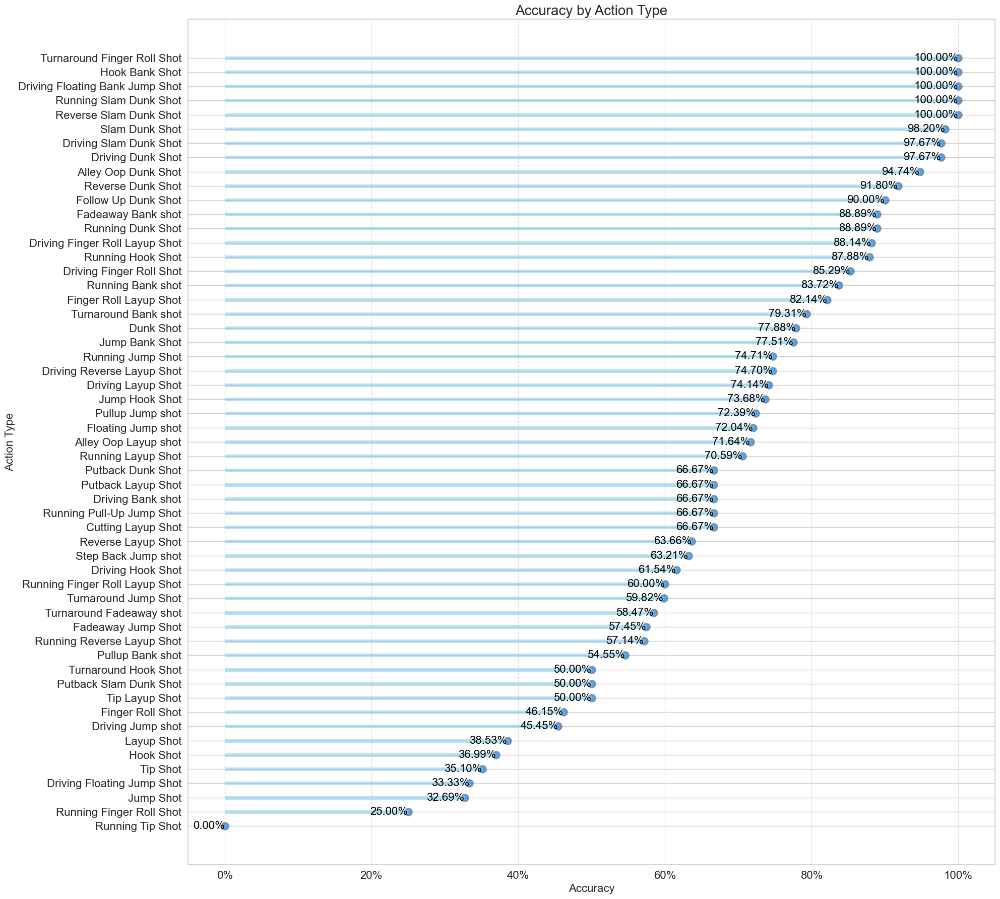

In [260]:
acc=pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/acc_forall.csv')
acc.sort_values(by='Accuracy',ascending=True,inplace=True)
# 绘制棒棒糖图
plt.figure(figsize=(20, 18))

# 绘制水平线
plt.hlines(y=acc['action_type'], xmin=0, xmax=acc['Accuracy'], color='skyblue', alpha=0.6, linewidth=5)

# 绘制点
plt.scatter(acc['Accuracy'], acc['action_type'], color='dodgerblue', alpha=0.8, s=100, edgecolor='grey', linewidth=2)

# 添加数据标签
for x, y, txt in zip(acc['Accuracy'], acc['action_type'], acc['Accuracy']):
    plt.text(x, y, f'{txt:.2%}', va='center', ha='right', fontsize=16, color='black')

# 添加标题和标签
plt.title('Accuracy by Action Type', fontsize=20)
plt.xlabel('Accuracy', fontsize=16)
plt.ylabel('Action Type', fontsize=16)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.0%}'))
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.savefig('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/accall.png',dpi=1500,transparent=True)
plt.show()

#### 分析投篮方式与时间的关系
1. period的关系
2. season的关系

In [360]:
df=pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')
period_counts = df.groupby(['combined_shot_type', 'period']).size().unstack().fillna(0)
period_counts

period,1,2,3,4,5,6,7
combined_shot_type,,,,,,,
Bank Shot,35.0,22.0,42.0,21.0,0.0,0.0,0.0
Dunk,266.0,253.0,296.0,228.0,11.0,2.0,0.0
Hook Shot,42.0,25.0,35.0,23.0,2.0,0.0,0.0
Jump Shot,5104.0,4261.0,5342.0,4756.0,216.0,24.0,5.0
Layup,1215.0,1040.0,1246.0,978.0,48.0,4.0,1.0
Tip Shot,37.0,33.0,41.0,37.0,3.0,0.0,1.0


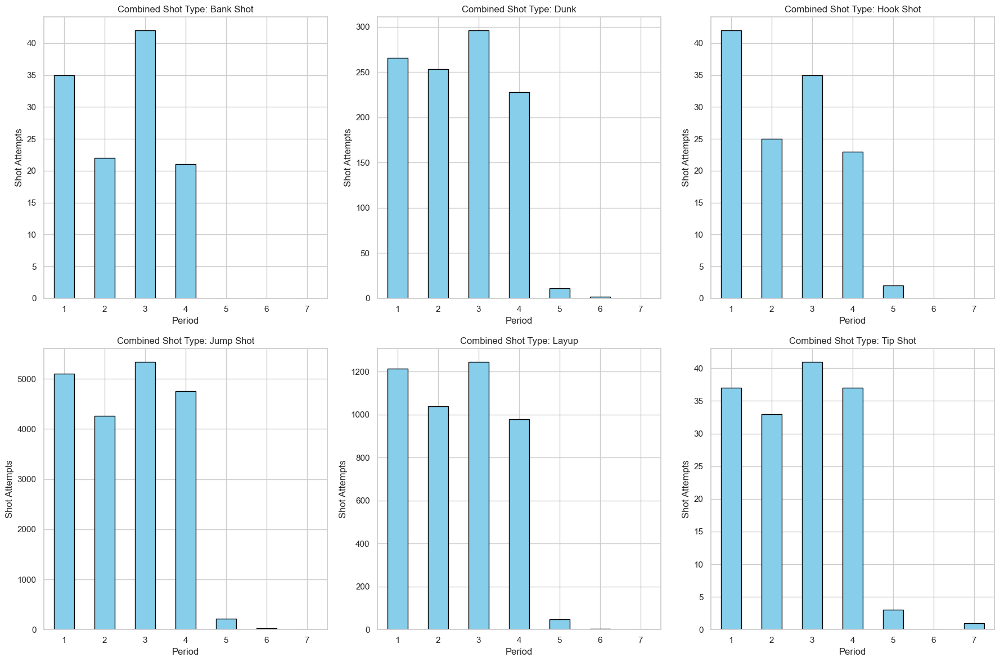

In [361]:
import math
# 计算每种 combined_shot_type 在不同 period 的出手次数
shot_counts = df.groupby(['combined_shot_type', 'period']).size().unstack().fillna(0)

# 获取 combined_shot_types 列表
combined_shot_types = shot_counts.index.unique()
num_shot_types = len(combined_shot_types)

# 设置组图的行数和列数
n_cols = 3  # 每行显示3个子图
n_rows = math.ceil(num_shot_types / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12))

# 绘制每个 combined_shot_type 的子图
for i, shot_type in enumerate(combined_shot_types):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]
    shot_counts.loc[shot_type].plot(kind='bar', ax=ax, color='skyblue', edgecolor='black')
    ax.set_title(f'Combined Shot Type: {shot_type}')
    ax.set_xlabel('Period')
    ax.set_ylabel('Shot Attempts')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=0, ha='center')

# 隐藏未使用的子图
if num_shot_types < n_rows * n_cols:
    for j in range(num_shot_types, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])
plt.tight_layout()
plt.savefig('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/Period.png',dpi=1000,transparent=True)
plt.show()

上面的分析：不同的投篮类型在不同的比赛节期间的分布：

1. Jump Shot：是最常见的投篮类型，在所有节期间都有出现，特别是在第1和第3节期间出现次数最多。第5节期间几乎没有Jump Shot。
2. Layup：在第1到第4节期间比较常见，尤其是第3节最多。第5节期间几乎没有Layup。
3. Dunk：主要集中在第1到第4节，特别是第3节最多。第5节期间几乎没有Dunk。
4. Hook Shot：在第1到第4节都有出现，第3节最多，第5节期间几乎没有Hook Shot。
5. Tip Shot：在第1到第4节期间出现次数均衡，第3节和第4节较多，第5节期间几乎没有Tip Shot。
6. Bank Shot：在第1到第4节期间出现次数均衡，第3节最多，第5节期间几乎没有Bank Shot。


##### season的关系

In [ ]:
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# 计算每种 combined_shot_type 在不同 period 的出手次数
shot_counts_withseadson = df.groupby(['combined_shot_type', 'season']).size().unstack().fillna(0)
shot_counts_withseadson.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/season_cbtype.csv')

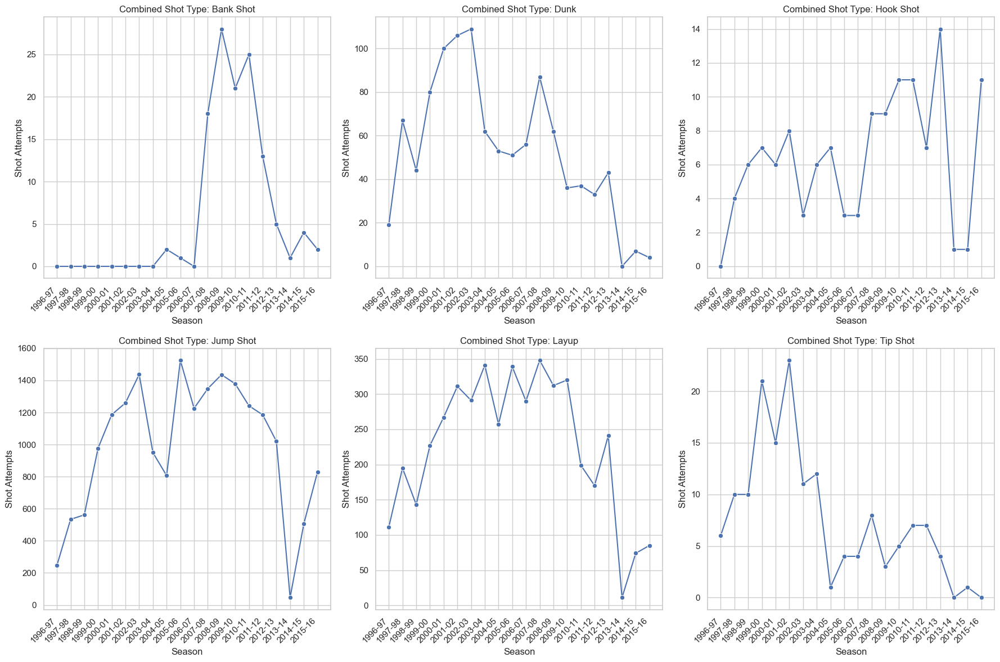

In [356]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# 加载用户上传的CSV文件
file_path = '/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/season_cbtype.csv'
df = pd.read_csv(file_path)

# 转换数据格式，适应绘图需要
df_melted = df.melt(id_vars='combined_shot_type', var_name='season', value_name='shot_attempts')

# 获取 combined_shot_types 列表
combined_shot_types = df_melted['combined_shot_type'].unique()
num_shot_types = len(combined_shot_types)

# 设置组图的行数和列数
n_cols = 3
n_rows = math.ceil(num_shot_types / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12))

# 绘制每个 combined_shot_type 的子图
for i, shot_type in enumerate(combined_shot_types):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]
    data = df_melted[df_melted['combined_shot_type'] == shot_type]
    sns.lineplot(x='season', y='shot_attempts', data=data, ax=ax, marker='o')
    ax.set_title(f'Combined Shot Type: {shot_type}')
    ax.set_xlabel('Season')
    ax.set_ylabel('Shot Attempts')
    ax.tick_params(axis='x', rotation=45)
    ax.set_xticks(range(len(data['season'].unique())))
    ax.set_xticklabels(data['season'].unique(), rotation=45, ha='right')
# 隐藏未使用的子图
if num_shot_types < n_rows * n_cols:
    for j in range(num_shot_types, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])
plt.tight_layout()
plt.savefig('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/season.png',dpi=1000,transparent=True)
plt.show()

##### 和minutes_remaining的关系

In [283]:
# 计算每种 combined_shot_type 在不同 minutes_remaining 的出手次数
shot_counts_withminutes_remaining = data_cleaned_error.groupby(['combined_shot_type', 'minutes_remaining']).size().unstack().fillna(0)
shot_counts_withminutes_remaining.T.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/minutes_remaining.csv')

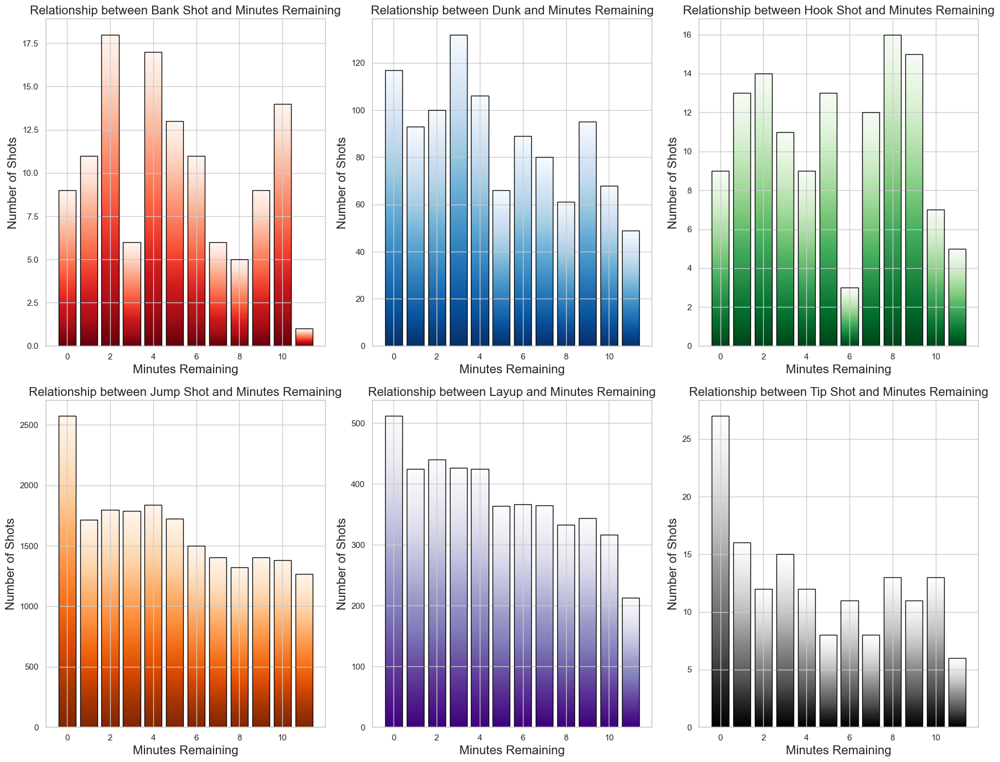

In [355]:
import matplotlib.pyplot as plt
data=pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/minutes_remaining.csv')

# 创建渐变色函数
def gradientbars(bars, cmap):
    grad = np.atleast_2d(np.linspace(0, 1, 256)).T
    ax = bars[0].axes
    lim = ax.get_xlim() + ax.get_ylim()
    for bar in bars:
        bar.set_facecolor("none")
        x, y = bar.get_xy()
        w, h = bar.get_width(), bar.get_height()
        grad = np.atleast_2d(np.linspace(0, 1, int(h * 256 // lim[3]))).T
        ax.imshow(grad, extent=[x, x + w, y, y + h], aspect="auto", zorder=0, cmap=cmap)
    ax.axis(lim)

# 设置全局字体大小
plt.rcParams.update({'font.size': 14})

# 设置图表的大小和子图的布局
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 14))
axes = axes.flatten()

# 投篮类型列表
shot_types = data.columns[1:]

# 更多颜色选择
# cmaps = ['BuGn', 'Greens', 'GnBu', 'Blues', 'PuBu', 'BuPu']
cmaps = [
    'Reds', 'Blues', 'Greens', 'Oranges', 'Purples', 'Greys',
    'viridis', 'plasma', 'inferno', 'magma', 'cividis', 'cool',
    'hot', 'spring', 'summer', 'autumn', 'winter'
]
# 绘制每个投篮类型的子图
for i, shot_type in enumerate(shot_types):
    cmap = plt.get_cmap(cmaps[i % len(cmaps)])
    bars = axes[i].bar(data['minutes_remaining'], data[shot_type], color='none', edgecolor='black')
    gradientbars(bars, cmap)
    axes[i].set_title(f'Relationship between {shot_type} and Minutes Remaining',fontsize=16)
    axes[i].set_xlabel('Minutes Remaining', fontsize=16)
    axes[i].set_ylabel('Number of Shots', fontsize=16)
    axes[i].grid(True)
# 调整子图之间的间距
plt.subplots_adjust(wspace=0.3, hspace=0.3)
# 调整子图布局
plt.tight_layout()
plt.savefig('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/MinutesRemaining.png',dpi=1000,transparent=True)
plt.show()

#### FEI

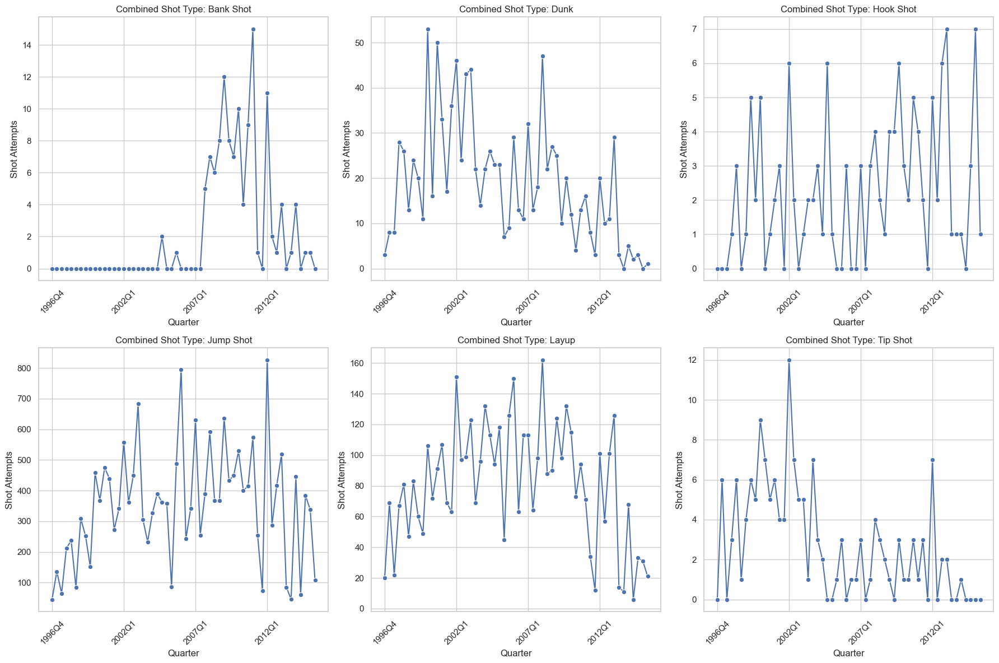

In [245]:
# 加载CSV文件
file_path = '/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/game_date_cbtype.csv'
df = pd.read_csv(file_path, index_col=0)

# 转换数据格式，适应绘图需要
df_melted = df.reset_index().melt(id_vars='combined_shot_type', var_name='game_date', value_name='shot_attempts')

# 将game_date转换为日期格式
df_melted['game_date'] = pd.to_datetime(df_melted['game_date'])

# 按季度汇总出手次数
df_melted['quarter'] = df_melted['game_date'].dt.to_period('Q')
quarterly_data = df_melted.groupby(['combined_shot_type', 'quarter'])['shot_attempts'].sum().reset_index()

# 将 'quarter' 列转换为字符串格式
quarterly_data['quarter'] = quarterly_data['quarter'].astype(str)

# 获取 combined_shot_types 列表
combined_shot_types = quarterly_data['combined_shot_type'].unique()
num_shot_types = len(combined_shot_types)

# 设置组图的行数和列数
n_cols = 3
n_rows = math.ceil(num_shot_types / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 12))

# 绘制每个 combined_shot_type 的子图
for i, shot_type in enumerate(combined_shot_types):
    row = i // n_cols
    col = i % n_cols
    ax = axes[row, col]
    data = quarterly_data[quarterly_data['combined_shot_type'] == shot_type]
    sns.lineplot(x='quarter', y='shot_attempts', data=data, ax=ax, marker='o')
    ax.set_title(f'Combined Shot Type: {shot_type}')
    ax.set_xlabel('Quarter')
    ax.set_ylabel('Shot Attempts')
    ax.xaxis.set_major_locator(plt.MaxNLocator(6))  # 只显示6个主要的时间刻度标签
    ax.tick_params(axis='x', rotation=45)

# 隐藏未使用的子图
if num_shot_types < n_rows * n_cols:
    for j in range(num_shot_types, n_rows * n_cols):
        fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.show()

In [277]:
# 创建透视表，将第一列设置为时间，后面几列为不同的 combined_shot_type
pivot_table = quarterly_data.pivot(index='quarter', columns='combined_shot_type', values='shot_attempts').reset_index()
pivot_table=pivot_table.sort_values(by='quarter')
pivot_table.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/test.csv')

#### 分析投篮位置的分布

#### 投篮位置与投篮类型的关系

In [362]:
from matplotlib.patches import Arc, Circle, Rectangle
def draw_ball_field(color='#20458C', lw=2):
    """
    绘制篮球场
    """
    # 新建一个大小为(6,6)的绘图窗口
    plt.figure(figsize=(6, 6))
    # 获得当前的Axes对象ax,进行绘图
    ax = plt.gca()

    # 对篮球场进行底色填充
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    # 设置篮球场填充图层为最底层
    lines_outer_rec.set_zorder(0)
    # 将rec添加进ax
    ax.add_patch(lines_outer_rec)

    # 绘制篮筐,半径为7.5
    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    # 将circle添加进ax
    ax.add_patch(circle_ball)

    # 绘制篮板,尺寸为(60,1)
    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    # 将rec添加进ax
    ax.add_patch(plate)

    # 绘制2分区的外框线,尺寸为(160,190)
    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    # 将rec添加进ax
    ax.add_patch(outer_rec)

    # 绘制2分区的内框线,尺寸为(120,190)
    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    # 将rec添加进ax
    ax.add_patch(inner_rec)

    # 绘制罚球区域圆圈,半径为60
    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    # 将circle添加进ax
    ax.add_patch(circle_punish)

    # 绘制三分线的左边线
    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    # 将rec添加进ax
    ax.add_patch(three_left_rec)

    # 绘制三分线的右边线
    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    # 将rec添加进ax
    ax.add_patch(three_right_rec)

    # 绘制三分线的圆弧,圆心为(0,0),半径为238.66,起始角度为22.8,结束角度为157.2
    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    # 将arc添加进ax
    ax.add_patch(three_arc)

    # 绘制中场处的外半圆,半径为60
    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    # 将arc添加进ax
    ax.add_patch(center_outer_arc)

    # 绘制中场处的内半圆,半径为20
    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    # 将arc添加进ax
    ax.add_patch(center_inner_arc)

    # 绘制篮球场外框线,尺寸为(500,470)
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    # 将rec添加进ax
    ax.add_patch(lines_outer_rec)

    return ax

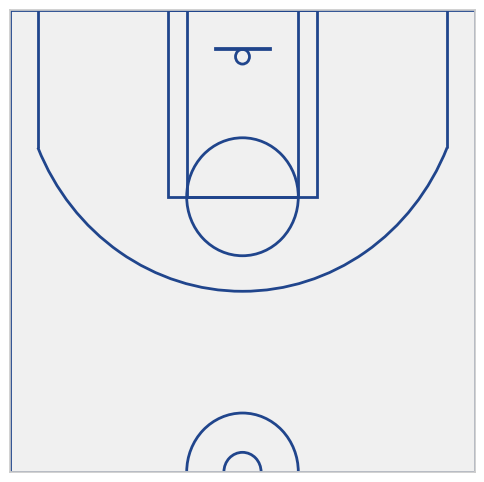

In [384]:
axs = draw_ball_field(color='#20458C', lw=2)
# 设置坐标轴范围
axs.set_xlim(-250, 250)
axs.set_ylim(422.5, -47.5)
# 消除坐标轴刻度
axs.set_xticks([])
axs.set_yticks([])
# 分类数据
df1 = df[df['shot_made_flag'] == '0']
df2 = df[df['shot_made_flag'] == '1']
# 绘制散点图
axs.scatter(x=df2['loc_x'], y=df2['loc_y'], s=30, marker='x', color='#A82B2B')
axs.scatter(x=df1['loc_x'], y=df1['loc_y'], s=30, marker='o', edgecolors='#3A7711', color="#F0F0F0", linewidths=2)
plt.show()

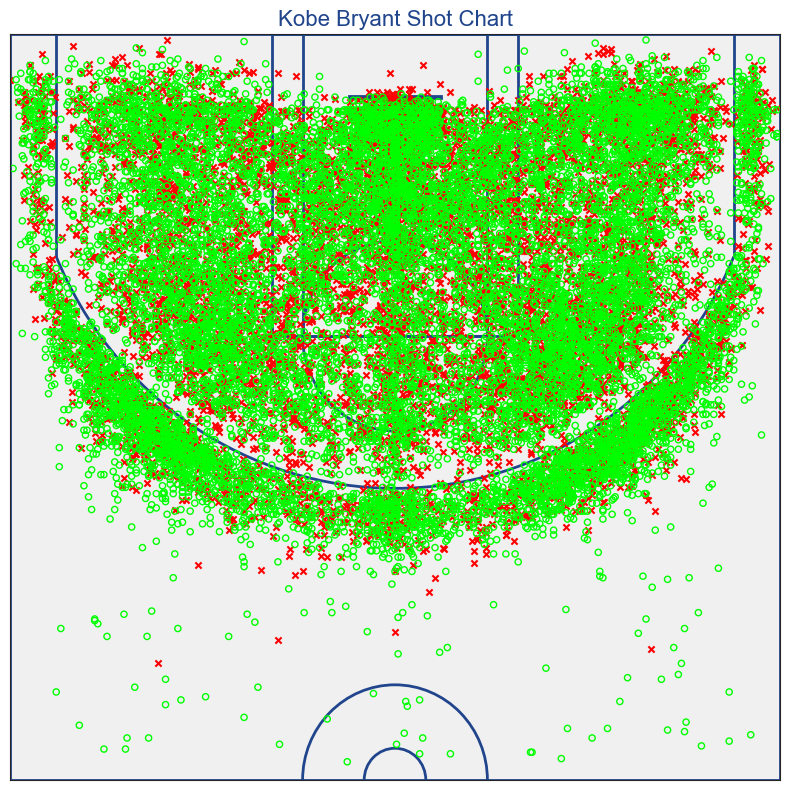

In [39]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd

# 示例数据（请替换为实际的DataFrame数据）
df=pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    # 对篮球场进行底色填充
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    # 绘制篮筐,半径为7.5
    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    # 绘制篮板,尺寸为(60,1)
    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    # 绘制2分区的外框线,尺寸为(160,190)
    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    # 绘制2分区的内框线,尺寸为(120,190)
    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    # 绘制罚球区域圆圈,半径为60
    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    # 绘制三分线的左边线
    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    # 绘制三分线的右边线
    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    # 绘制三分线的圆弧,圆心为(0,0),半径为238.66,起始角度为22.8,结束角度为157.2
    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    # 绘制中场处的外半圆,半径为60
    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    # 绘制中场处的内半圆,半径为20
    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    # 绘制篮球场外框线,尺寸为(500,470)
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 创建图形和轴
fig, ax = plt.subplots(figsize=(8, 8))

# 绘制篮球场
draw_ball_field(ax, color='#20458C', lw=2)

# 设置坐标轴范围
ax.set_xlim(-250, 250)
ax.set_ylim(422.5, -47.5)

# 消除坐标轴刻度
ax.set_xticks([])
ax.set_yticks([])

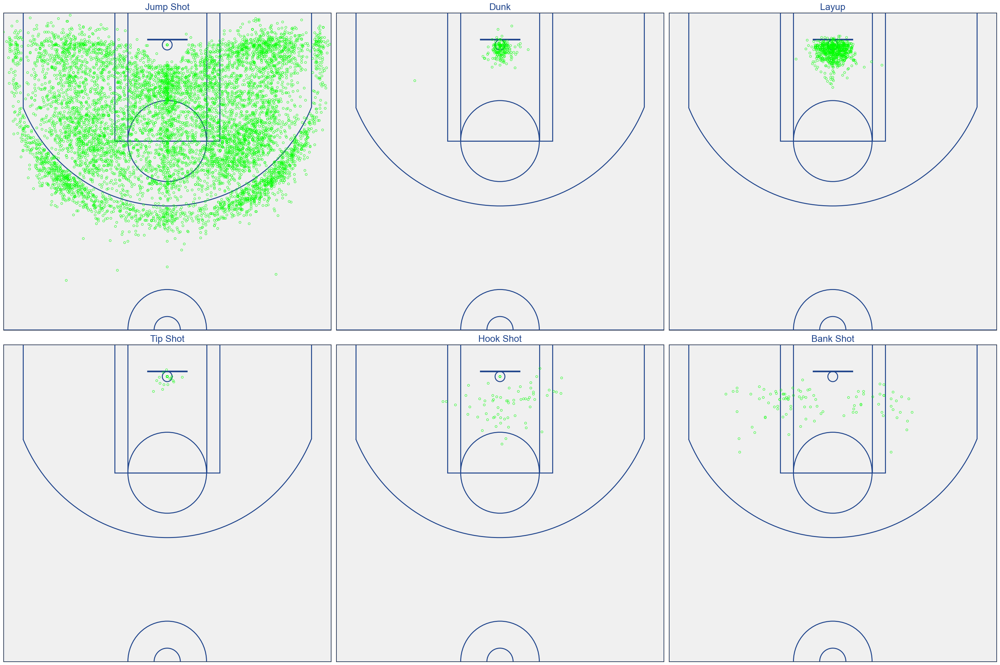

In [82]:
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    # 对篮球场进行底色填充
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    # 绘制篮筐,半径为7.5
    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    # 绘制篮板,尺寸为(60,1)
    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    # 绘制2分区的外框线,尺寸为(160,190)
    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    # 绘制2分区的内框线,尺寸为(120,190)
    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    # 绘制罚球区域圆圈,半径为60
    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    # 绘制三分线的左边线
    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    # 绘制三分线的右边线
    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    # 绘制三分线的圆弧,圆心为(0,0),半径为238.66,起始角度为22.8,结束角度为157.2
    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    # 绘制中场处的外半圆,半径为60
    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    # 绘制中场处的内半圆,半径为20
    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    # 绘制篮球场外框线,尺寸为(500,470)
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)
df=pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')
# 获取combine_shot_type的唯一值
shot_types = df['combined_shot_type'].unique()

# 定义子图的行数和列数
n_cols = 3
n_rows = (len(shot_types) + n_cols - 1) // n_cols

# 创建多个子图
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 10 * n_rows))

# 平展子图数组，方便迭代
axes = axes.flatten()

# 定义颜色
colors = plt.colormaps.get_cmap('tab10')

# 绘制不同类型的散点图
for i, shot_type in enumerate(shot_types):
    ax = axes[i]
    draw_ball_field(ax, color='#20458C', lw=2)
    df_shot_type = df[df['combined_shot_type'] == shot_type]
    # print(df_shot_type['shot_made_flag'].dtype)
    df1=df_shot_type[df_shot_type['shot_made_flag']==1.0]
    df2=df_shot_type[df_shot_type['shot_made_flag']==0.0]
    # ax.scatter(x=df2['loc_x'], y=df2['loc_y'], s=20, marker='x', color='#FF0000', label='Made Shot')
    ax.scatter(x=df1['loc_x'], y=df1['loc_y'], s=20, marker='o', edgecolors='#00FF00', facecolors='none', linewidths=1, label='Made Shot',alpha=0.7)
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{shot_type}', fontsize=20, color='#20458C')

# 删除多余的子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

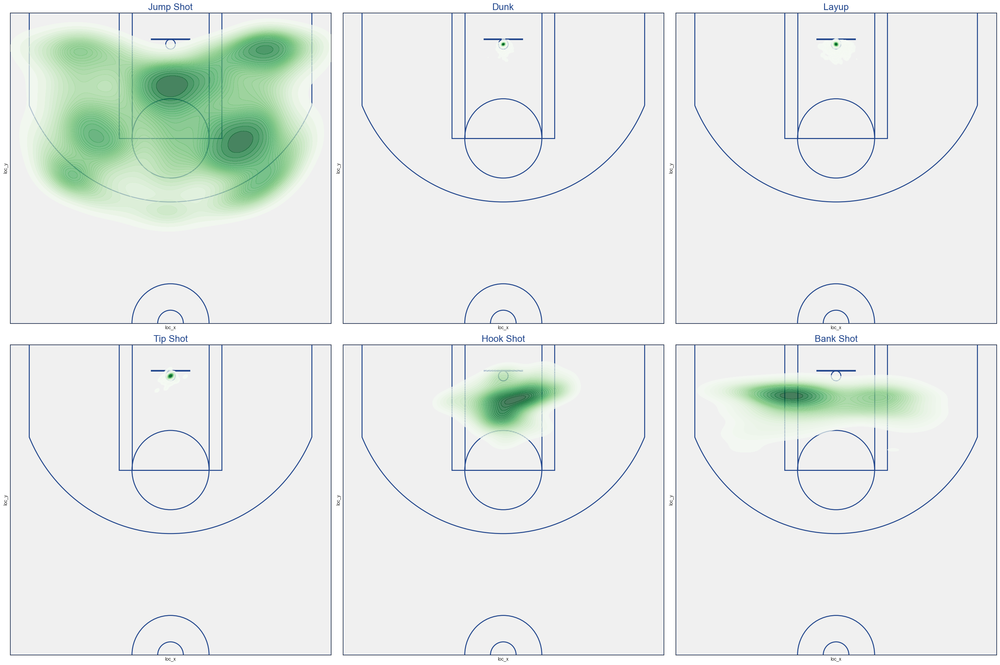

In [98]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    # 对篮球场进行底色填充
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    # 绘制篮筐,半径为7.5
    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    # 绘制篮板,尺寸为(60,1)
    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    # 绘制2分区的外框线,尺寸为(160,190)
    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    # 绘制2分区的内框线,尺寸为(120,190)
    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    # 绘制罚球区域圆圈,半径为60
    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    # 绘制三分线的左边线
    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    # 绘制三分线的右边线
    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    # 绘制三分线的圆弧,圆心为(0,0),半径为238.66,起始角度为22.8,结束角度为157.2
    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    # 绘制中场处的外半圆,半径为60
    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    # 绘制中场处的内半圆,半径为20
    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    # 绘制篮球场外框线,尺寸为(500,470)
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 获取combine_shot_type的唯一值
shot_types = df['combined_shot_type'].unique()

# 定义子图的行数和列数
n_cols = 3
n_rows = (len(shot_types) + n_cols - 1) // n_cols

# 创建多个子图
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 10 * n_rows))

# 平展子图数组，方便迭代
axes = axes.flatten()

# 定义颜色
colors = plt.colormaps.get_cmap('tab10')

# 绘制不同类型的热力图
for i, shot_type in enumerate(shot_types):
    ax = axes[i]
    draw_ball_field(ax, color='#20458C', lw=2)
    # df_shot_type = df[df['combined_shot_type'] == shot_type]
    df_shot_type = df[(df['combined_shot_type'] == shot_type) & (df['shot_made_flag'] == 1.0)]

    # 检查数据是否有效
    if df_shot_type['loc_x'].nunique() > 1 and df_shot_type['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_shot_type['loc_x'], 
            y=df_shot_type['loc_y'], 
            fill=True, 
            cmap='Greens', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,  # 调整 levels 为较小的值
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{shot_type}', fontsize=20, color='#20458C')

# 删除多余的子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.savefig('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/made.png',dpi=1000,transparent=True)
plt.show()

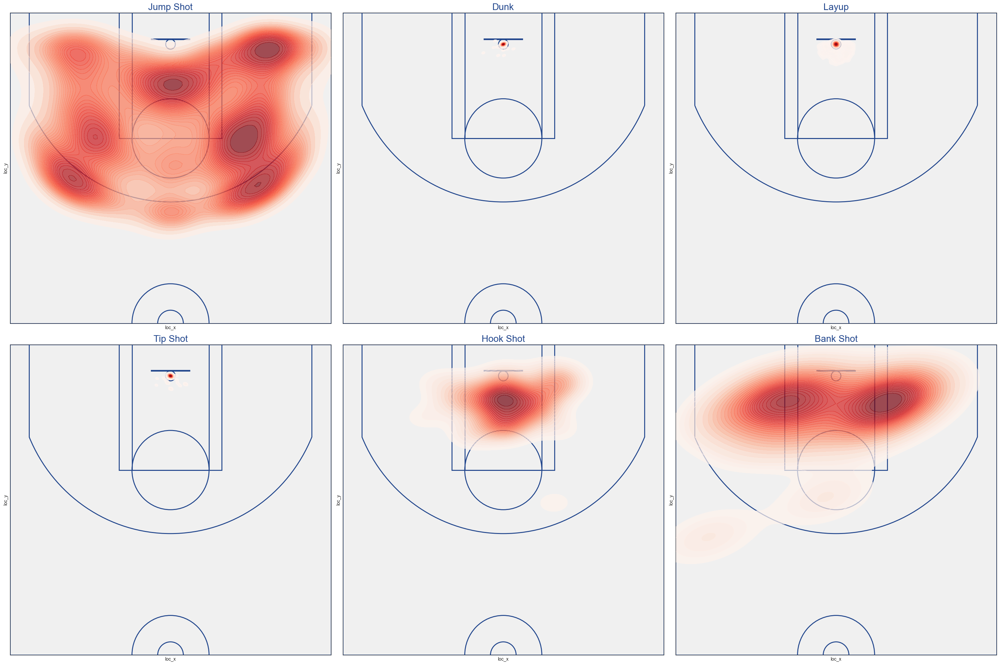

In [93]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    # 对篮球场进行底色填充
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    # 绘制篮筐,半径为7.5
    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    # 绘制篮板,尺寸为(60,1)
    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    # 绘制2分区的外框线,尺寸为(160,190)
    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    # 绘制2分区的内框线,尺寸为(120,190)
    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    # 绘制罚球区域圆圈,半径为60
    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    # 绘制三分线的左边线
    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    # 绘制三分线的右边线
    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    # 绘制三分线的圆弧,圆心为(0,0),半径为238.66,起始角度为22.8,结束角度为157.2
    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    # 绘制中场处的外半圆,半径为60
    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    # 绘制中场处的内半圆,半径为20
    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    # 绘制篮球场外框线,尺寸为(500,470)
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 获取combine_shot_type的唯一值
shot_types = df['combined_shot_type'].unique()

# 定义子图的行数和列数
n_cols = 3
n_rows = (len(shot_types) + n_cols - 1) // n_cols

# 创建多个子图
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 10 * n_rows))

# 平展子图数组，方便迭代
axes = axes.flatten()

# 定义颜色
colors = plt.colormaps.get_cmap('tab10')

# 绘制不同类型的热力图
for i, shot_type in enumerate(shot_types):
    ax = axes[i]
    draw_ball_field(ax, color='#20458C', lw=2)
    # df_shot_type = df[df['combined_shot_type'] == shot_type]
    df_shot_type = df[(df['combined_shot_type'] == shot_type) & (df['shot_made_flag'] == 0.0)]

    # 检查数据是否有效
    if df_shot_type['loc_x'].nunique() > 1 and df_shot_type['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_shot_type['loc_x'], 
            y=df_shot_type['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,  # 调整 levels 为较小的值
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{shot_type}', fontsize=20, color='#20458C')

# 删除多余的子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


#### 对jumpshot进行更深投入的分析

##### jumpshot和投射距离的统计图

In [102]:
### select data 
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/kobe_data_dpna_errors.csv')
df=df[df['combined_shot_type']=='Jump Shot']
df.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')
df_miss=df[df['shot_made_flag']==0]
df_made=df[df['shot_made_flag']==1]
df_made

,Unnamed: 0,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
1,2,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,3
6,8,Jump Shot,Jump Shot,265,20000012,33.9363,-65,108,-118.3348,6,...,2PT Field Goal,Left Side(L),In The Paint (Non-RA),8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,9
9,11,Jump Shot,Jump Shot,4,20000019,33.9173,121,127,-118.1488,11,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-11-01,LAL vs. UTA,UTA,12
10,12,Running Jump Shot,Jump Shot,27,20000019,33.9343,-67,110,-118.3368,7,...,2PT Field Goal,Left Side(L),In The Paint (Non-RA),8-16 ft.,1610612747,Los Angeles Lakers,2000-11-01,LAL vs. UTA,UTA,13
14,17,Jump Shot,Jump Shot,138,20000019,33.8183,-117,226,-118.3868,8,...,3PT Field Goal,Left Side Center(LC),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2000-11-01,LAL vs. UTA,UTA,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25676,30674,Jump Shot,Jump Shot,81,49900088,33.8283,117,216,-118.1528,2,...,3PT Field Goal,Right Side Center(RC),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30675
25678,30676,Running Jump Shot,Jump Shot,98,49900088,34.0443,-141,0,-118.4108,0,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30677
25682,30681,Jump Shot,Jump Shot,218,49900088,33.7833,-18,261,-118.2878,0,...,3PT Field Goal,Center(C),Above the Break 3,24+ ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30682
25687,30688,Jump Shot,Jump Shot,308,49900088,33.9833,-126,61,-118.3958,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-06-19,LAL vs. IND,IND,30689


- 我们使用r语言，以对made、miss、all的投射距离进行了可视化
- <img src="image/投篮方式分布/jumpshotana/距离/my_plot.png" alt="My Plot" style="width:50%;">

In [108]:
# Create the required DataFrame with 'shot_distance' and 'type' columns
df_all = df.copy()
df_miss = df[df['shot_made_flag'] == 0].copy()
df_made = df[df['shot_made_flag'] == 1].copy()

# Ensure the 'type' column is correct
df_all['type'] = 'ALL'
df_miss['type'] = 'Miss'
df_made['type'] = 'Made'

# Combine all three DataFrames
df_combined = pd.concat([df_all[['shot_distance', 'type']],
                         df_miss[['shot_distance', 'type']],
                         df_made[['shot_distance', 'type']]])
df_combined.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/shotdistance_type.csv')

##### 我现在要研究问题 投篮距离和投篮准确度是否有一定关系？

In [104]:
# Calculate shooting accuracy for each shot distance
# Group by 'shot_distance' and calculate the shooting accuracy
accuracy_by_distance = df.groupby('shot_distance')['shot_made_flag'].mean().reset_index()
# Rename the columns for clarity
accuracy_by_distance.columns = ['shot_distance', 'shooting_accuracy']
accuracy_by_distance.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshotacc.csv')

通过spearman检验发现
1. shot_distance 	shooting_accuracy 
2. shot_distance	1(0.000***)	-0.86(0.000***)
3. shooting_accuracy	-0.86(0.000***)	1(0.000***)
- 注：***、**、*分别代表1%、5%、10%的显著性水平


#### 投篮位置和不同season的关系

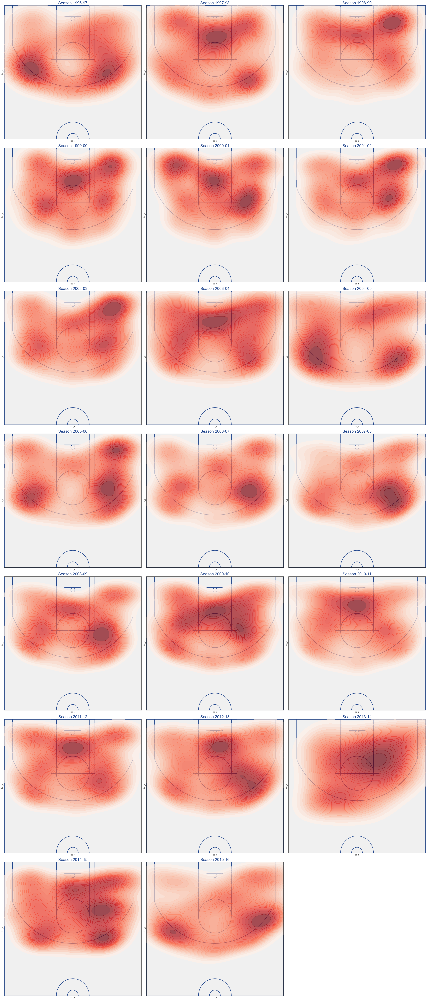

In [114]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 获取赛季的唯一值
seasons = sorted(df['season'].unique())

# 定义子图的行数和列数
n_cols = 3
n_rows = (len(seasons) + n_cols - 1) // n_cols

# 创建多个子图
fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 10 * n_rows))

# 平展子图数组，方便迭代
axes = axes.flatten()

# 定义颜色
colors = plt.colormaps.get_cmap('tab10')

# 绘制不同赛季的热力图
for i, season in enumerate(seasons):
    ax = axes[i]
    draw_ball_field(ax, color='#20458C', lw=2)
    df_season = df[df['season'] == season]

    # 检查数据是否有效
    if df_season['loc_x'].nunique() > 1 and df_season['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_season['loc_x'], 
            y=df_season['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,  # 调整 levels 为较小的值
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Season {season}', fontsize=20, color='#20458C')

# 删除多余的子图
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


MovieWriter imagemagick unavailable; using Pillow instead.


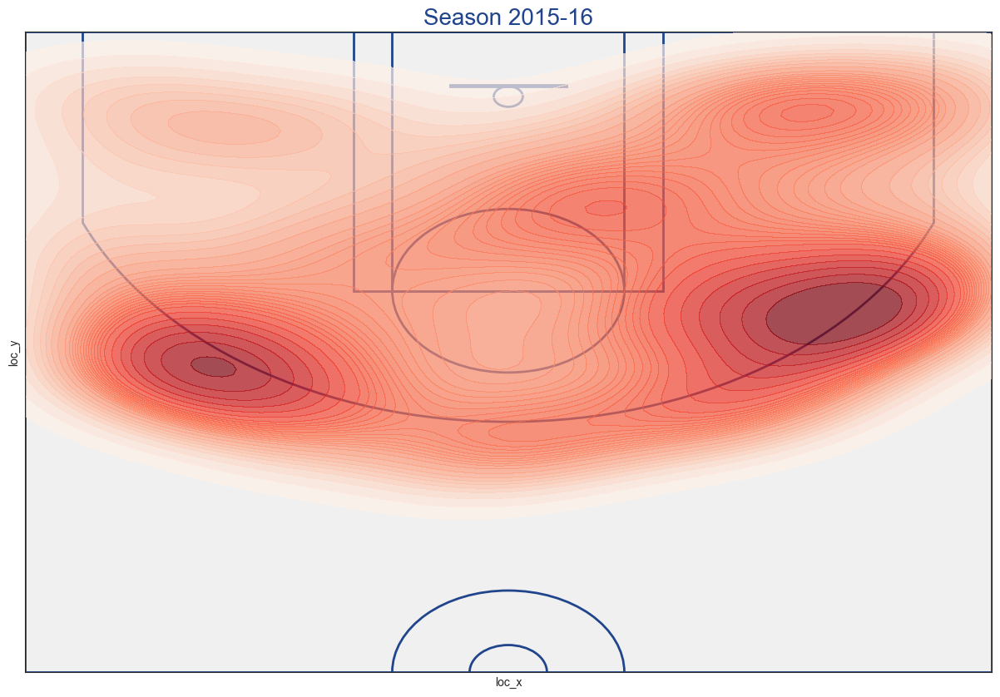

In [122]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns
from matplotlib.animation import FuncAnimation
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 获取赛季的唯一值，并按顺序排序
seasons = sorted(df['season'].unique())

fig, ax = plt.subplots(figsize=(15, 10))

def update(season):
    ax.clear()
    draw_ball_field(ax, color='#20458C', lw=2)
    df_season = df[df['season'] == season]

    # 检查数据是否有效
    if df_season['loc_x'].nunique() > 1 and df_season['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_season['loc_x'], 
            y=df_season['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,  # 调整 levels 为较小的值
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'Season {season}', fontsize=20, color='#20458C')

anim = FuncAnimation(fig, update, frames=seasons, repeat=False)

anim.save('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/season_shot_heatmap.gif', writer='imagemagick', fps=0.5)

plt.show()

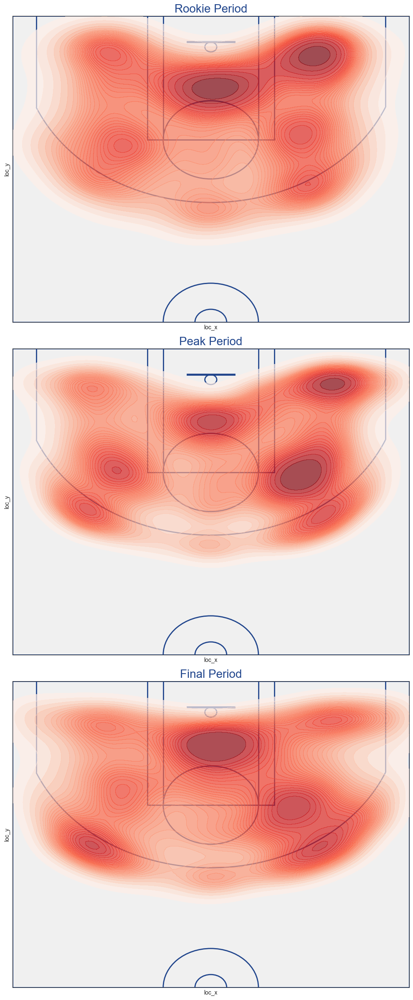

In [123]:
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 定义五年周期
periods = [
    ('Rookie Period', ['1996-97', '1997-98', '1998-99', '1999-00']),
    ('Peak Period', ['2000-01', '2001-02', '2002-03', '2003-04', '2004-05','2005-06'
                 , '2006-07', '2007-08', '2008-09', '2009-10']),
    ('Final Period', ['2010-11','2011-12', '2012-13', '2013-14', '2014-15','2015-16'])
]

# 创建多个子图
fig, axes = plt.subplots(len(periods), 1, figsize=(10, 8 * len(periods)))

# 绘制不同周期的热力图
for ax, (period, seasons) in zip(axes, periods):
    draw_ball_field(ax, color='#20458C', lw=2)
    df_period = df[df['season'].isin(seasons)]

    # 检查数据是否有效
    if df_period['loc_x'].nunique() > 1 and df_period['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_period['loc_x'], 
            y=df_period['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,  # 调整 levels 为较小的值
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{period}', fontsize=20, color='#20458C')

plt.tight_layout()
plt.show()

MovieWriter imagemagick unavailable; using Pillow instead.


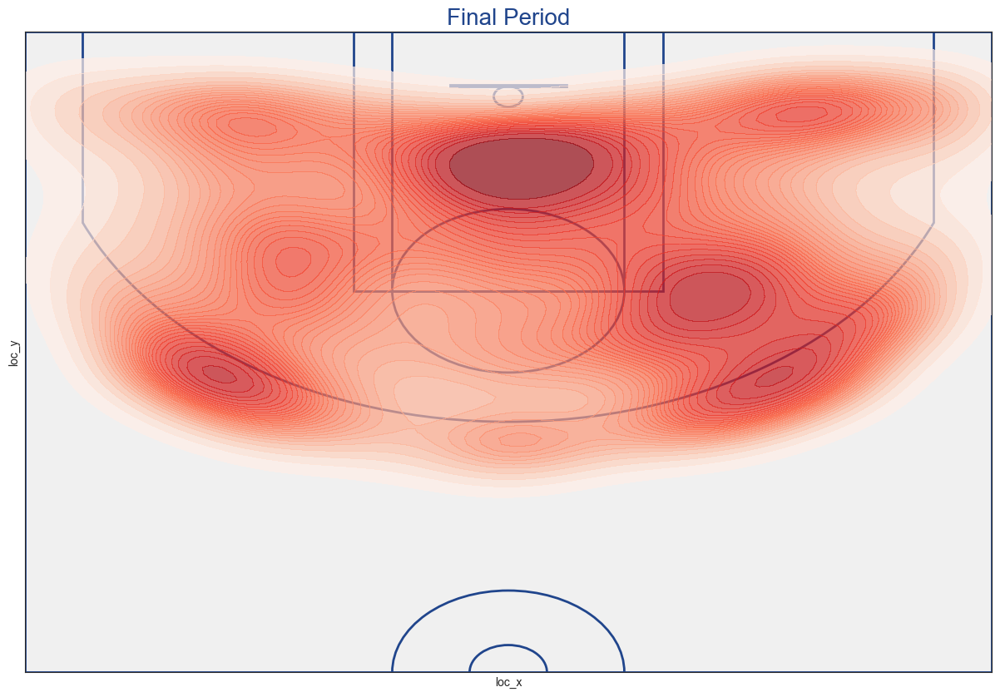

In [124]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns
from matplotlib.animation import FuncAnimation
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 定义阶段
periods = [
    ('Rookie Period', ['1996-97', '1997-98', '1998-99', '1999-00']),
    ('Peak Period', ['2000-01', '2001-02', '2002-03', '2003-04', '2004-05', '2005-06',
                     '2006-07', '2007-08', '2008-09', '2009-10']),
    ('Final Period', ['2010-11', '2011-12', '2012-13', '2013-14', '2014-15', '2015-16'])
]

fig, ax = plt.subplots(figsize=(15, 10))

def update(frame):
    ax.clear()
    period, seasons = periods[frame]
    draw_ball_field(ax, color='#20458C', lw=2)
    df_period = df[df['season'].isin(seasons)]

    if df_period['loc_x'].nunique() > 1 and df_period['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_period['loc_x'], 
            y=df_period['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{period}', fontsize=20, color='#20458C')

anim = FuncAnimation(fig, update, frames=len(periods), repeat=False)
anim.save('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/kobe_shot_heatmap_differendperiods.gif', writer='imagemagick', fps=1)
plt.show()

#### 投篮位置和不同的period的关系

MovieWriter imagemagick unavailable; using Pillow instead.


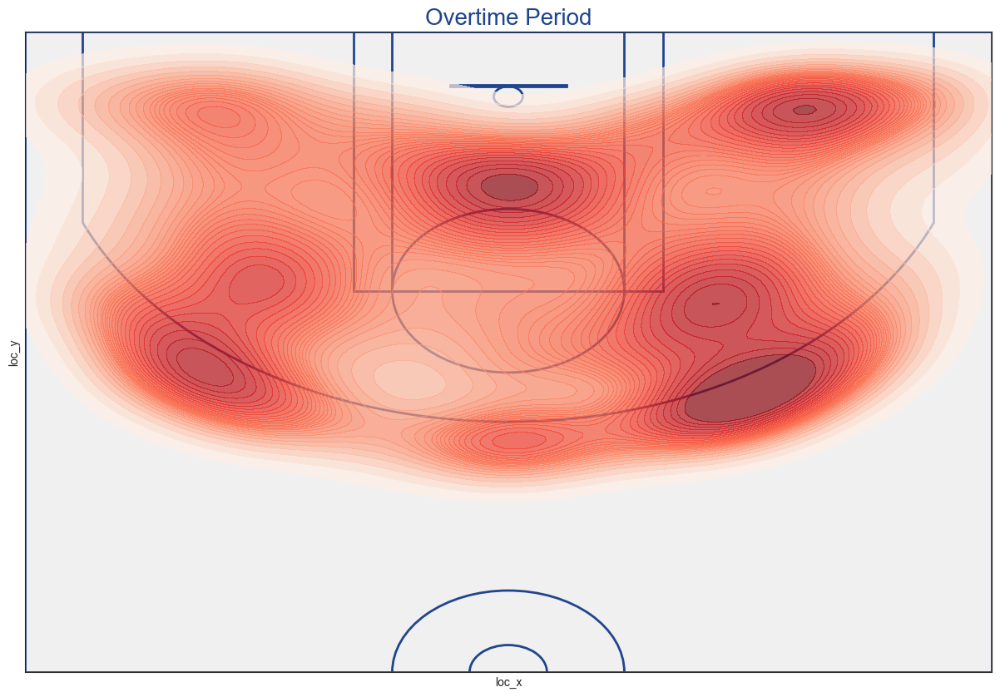

In [125]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns
from matplotlib.animation import FuncAnimation
# 添加加时赛的标记
df['period_label'] = df['period'].apply(lambda x: 'Overtime Period' if x in [4, 5, 6, 7] else 'Regular Period')

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 定义阶段
periods = [
    ('Regular Period', df[df['period_label'] == 'Regular Period']),
    ('Overtime Period', df[df['period_label'] == 'Overtime Period'])
]

fig, ax = plt.subplots(figsize=(15, 10))

def update(frame):
    ax.clear()
    period, df_period = periods[frame]
    draw_ball_field(ax, color='#20458C', lw=2)

    if df_period['loc_x'].nunique() > 1 and df_period['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_period['loc_x'], 
            y=df_period['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{period}', fontsize=20, color='#20458C')

anim = FuncAnimation(fig, update, frames=len(periods), repeat=False)
anim.save('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/kobe_shot_heatmap_whichperiods.gif', writer='imagemagick', fps=1)
plt.show()

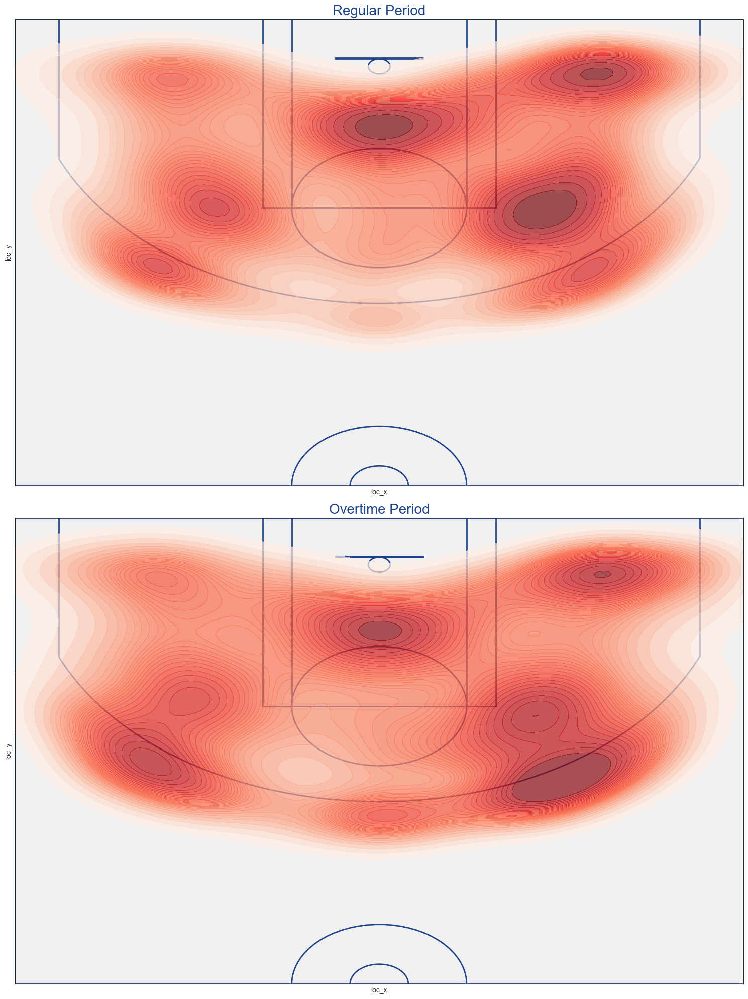

In [126]:
# 添加加时赛的标记
df['period_label'] = df['period'].apply(lambda x: 'Overtime Period' if x in [4, 5, 6, 7] else 'Regular Period')

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 定义阶段
periods = [
    ('Regular Period', df[df['period_label'] == 'Regular Period']),
    ('Overtime Period', df[df['period_label'] == 'Overtime Period'])
]

# 创建多个子图
fig, axes = plt.subplots(len(periods), 1, figsize=(15, 10 * len(periods)))

# 绘制不同阶段的热力图
for ax, (period, df_period) in zip(axes, periods):
    draw_ball_field(ax, color='#20458C', lw=2)

    if df_period['loc_x'].nunique() > 1 and df_period['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_period['loc_x'], 
            y=df_period['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{period}', fontsize=20, color='#20458C')

plt.tight_layout()
# plt.savefig('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/kobe_shot_heatmap_periods.png')
plt.show()

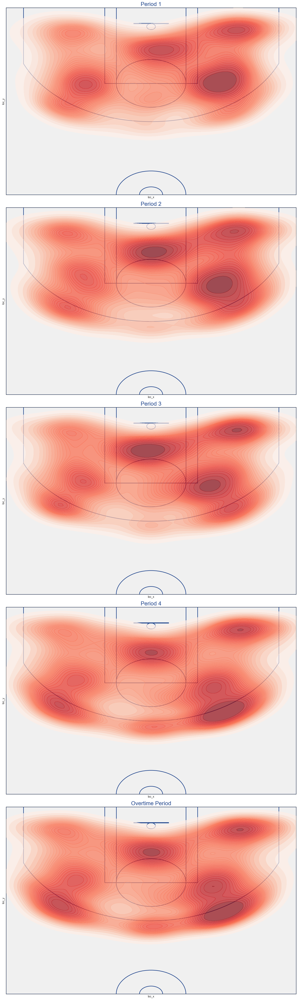

In [128]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns

# # 读取数据
# df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')

# 添加加时赛的标记
df['period_label'] = df['period'].apply(lambda x: 'Overtime Period' if x in [4, 5, 6, 7] else f'Period {x+1}')

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 定义阶段
periods = [
    ('Period 1', df[df['period'] == 1]),
    ('Period 2', df[df['period'] == 2]),
    ('Period 3', df[df['period'] == 3]),
    ('Period 4', df[df['period'] == 4]),
    ('Overtime Period', df[df['period_label'] == 'Overtime Period'])
]

# 创建多个子图
fig, axes = plt.subplots(len(periods), 1, figsize=(15, 10 * len(periods)))
# fig, axes = plt.subplots(n_rows, n_cols, figsize=(30, 10 * n_rows))
# 绘制不同阶段的热力图
for ax, (period, df_period) in zip(axes, periods):
    draw_ball_field(ax, color='#20458C', lw=2)

    if df_period['loc_x'].nunique() > 1 and df_period['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_period['loc_x'], 
            y=df_period['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{period}', fontsize=20, color='#20458C')
plt.tight_layout()
plt.show()


#### 投篮位置和剩余时间分布关系

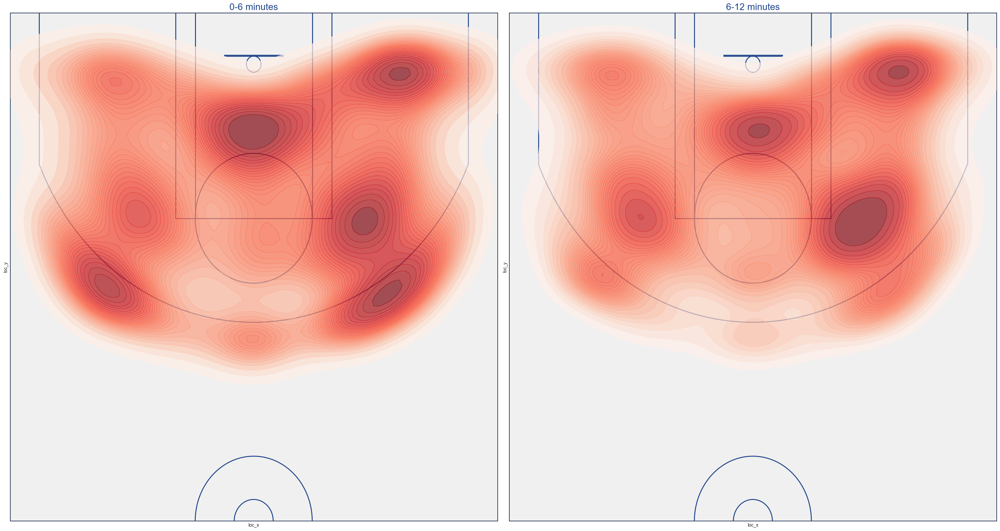

In [148]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')

# 定义每两分钟的时间段
time_bins = list(range(0, 13, 6))  # 0到12分钟，每2分钟一个间隔
time_labels = [f'{i}-{i+6} minutes' for i in range(0,12,6)]
df['time_bin'] = pd.cut(df['minutes_remaining'], bins=time_bins, labels=time_labels, right=False, include_lowest=True)

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 定义每两分钟的时间段
time_bins = [(f'{i}-{i+6} minutes', df[df['time_bin'] == f'{i}-{i+6} minutes']) for i in range(0, 12, 6)]

# 创建多个子图
fig, axes = plt.subplots( 1,len(time_bins), figsize=(30, 8 * len(time_bins)))

# 绘制不同剩余时间区间的热力图
for ax, (time_bin, df_time_bin) in zip(axes, time_bins):
    draw_ball_field(ax, color='#20458C', lw=2)
    if df_time_bin['loc_x'].nunique() > 1 and df_time_bin['loc_y'].nunique() > 1:
        sns.kdeplot(
            x=df_time_bin['loc_x'], 
            y=df_time_bin['loc_y'], 
            fill=True, 
            cmap='Reds', 
            thresh=0.05, 
            alpha=0.7, 
            levels=30,
            ax=ax
        )
    ax.set_xlim(-250, 250)
    ax.set_ylim(422.5, -47.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title(f'{time_bin}', fontsize=20, color='#20458C')

plt.tight_layout()
plt.show()


### 分析投篮区域的分布

#### 不同投篮区域的统计数量

In [169]:
# df.drop(columns=['Unnamed: 0','Unnamed: 0.1'],inplace=True)
df

,action_type,combined_shot_type,game_event_id,game_id,lat,loc_x,loc_y,lon,minutes_remaining,period,...,shot_type,shot_zone_area,shot_zone_basic,shot_zone_range,team_id,team_name,game_date,matchup,opponent,shot_id
0,Jump Shot,Jump Shot,12,20000012,34.0443,-157,0,-118.4268,10,1,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,2
1,Jump Shot,Jump Shot,35,20000012,33.9093,-101,135,-118.3708,7,1,...,2PT Field Goal,Left Side Center(LC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,3
2,Jump Shot,Jump Shot,43,20000012,33.8693,138,175,-118.1318,6,1,...,2PT Field Goal,Right Side Center(RC),Mid-Range,16-24 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,4
3,Jump Shot,Jump Shot,244,20000012,34.0553,-145,-11,-118.4148,9,3,...,2PT Field Goal,Left Side(L),Mid-Range,8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,6
4,Jump Shot,Jump Shot,265,20000012,33.9363,-65,108,-118.3348,6,3,...,2PT Field Goal,Left Side(L),In The Paint (Non-RA),8-16 ft.,1610612747,Los Angeles Lakers,2000-10-31,LAL @ POR,POR,9


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')

# 设置绘图样式
sns.set(style="whitegrid")
plt.figure(figsize=(20, 6))

def plot_shot_zone_counts(zone_column, title):
    # 计算统计
    counts = df[zone_column].value_counts().sort_index()
    percentages = counts / counts.sum() * 100

    # 创建条形图
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=counts.index, y=percentages, edgecolor='black', linewidth=1, 
                     palette=['#40916c', '#52b788', '#74c69d', '#95d5b2', '#b7e4c7', '#d8f3dc'], width=0.4)
    # 添加比例标签
    for p, count in zip(ax.patches, counts):
        ax.annotate(f'{count}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='baseline', 
                    fontsize=12, color='black', 
                    xytext=(0, 5), textcoords='offset points')

    # 设置图表标题和标签
    plt.title(title, fontsize=16)
    plt.xlabel(zone_column, fontsize=14)
    plt.ylabel('Percentage', fontsize=14)
    plt.xticks(rotation=45)
    plt.show()

# 计算每个区域的投篮准确率
def plot_shot_zone_accuracy(zone_column, title):
    # 计算每个区域的总投篮次数和命中次数
    total_counts = df[zone_column].value_counts().sort_index()
    made_counts = df[df['shot_made_flag'] == 1][zone_column].value_counts().sort_index()
    
    # 计算命中率
    accuracy = made_counts / total_counts * 100

    # 创建条形图
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(x=accuracy.index, y=accuracy, edgecolor='black', linewidth=1, 
                     palette=['#40916c', '#52b788', '#74c69d', '#95d5b2', '#b7e4c7', '#d8f3dc'], width=0.4)
    # 添加比例标签
    for p, acc in zip(ax.patches, accuracy):
        ax.annotate(f'{acc:.2f}%', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='baseline', 
                    fontsize=12, color='black', 
                    xytext=(0, 5), textcoords='offset points')

    # 设置图表标题和标签
    plt.title(title, fontsize=16)
    plt.xlabel(zone_column, fontsize=14)
    plt.ylabel('Accuracy (%)', fontsize=14)
    plt.xticks(rotation=45)
    plt.show()

# 绘制每个 shot zone 的统计图
plot_shot_zone_counts('shot_zone_area', 'Shot Zone Area Counts')
plot_shot_zone_counts('shot_zone_basic', 'Shot Zone Basic Counts')
plot_shot_zone_counts('shot_zone_range', 'Shot Zone Range Counts')

# 绘制每个 shot zone 的投篮准确率图
plot_shot_zone_accuracy('shot_zone_area', 'Shot Zone Area Accuracy')
plot_shot_zone_accuracy('shot_zone_basic', 'Shot Zone Basic Accuracy')
plot_shot_zone_accuracy('shot_zone_range', 'Shot Zone Range Accuracy')


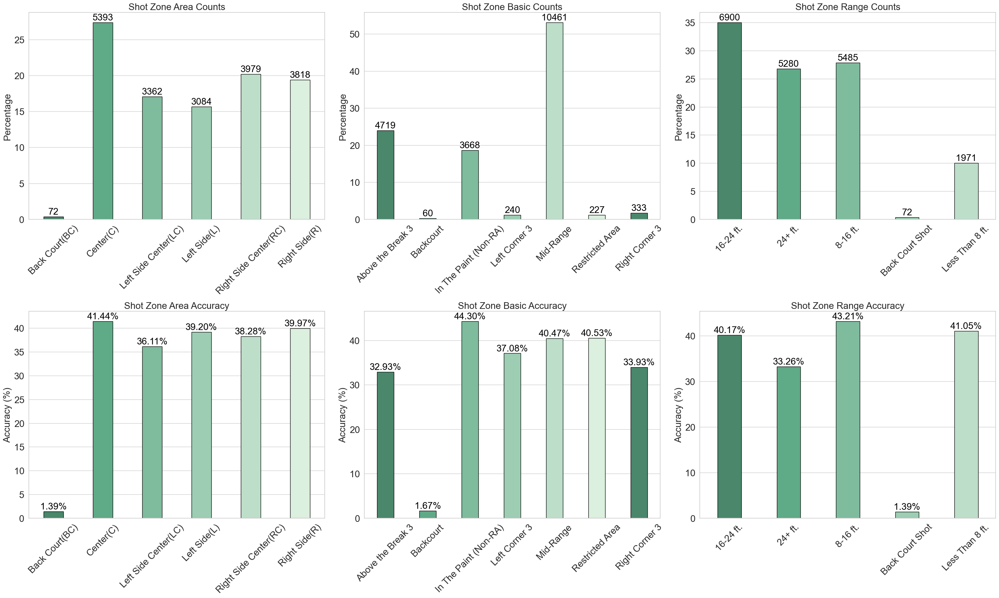

In [201]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')

# 设置绘图样式
sns.set(style="whitegrid")
def plot_shot_zone_counts(ax, zone_column, title):
    # 计算统计
    counts = df[zone_column].value_counts().sort_index()
    percentages = counts / counts.sum() * 100

    # 创建条形图
    sns.barplot(x=counts.index, y=percentages, edgecolor='black', linewidth=1, 
                palette=['#40916c', '#52b788', '#74c69d', '#95d5b2', '#b7e4c7', '#d8f3dc'], width=0.4, ax=ax)
    # 添加比例标签
    for p, count in zip(ax.patches, counts):
        ax.annotate(f'{count}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='baseline', 
                    fontsize=20, color='black', 
                    xytext=(0, 5), textcoords='offset points')

    # 设置图表标题和标签
    ax.set_title(title, fontsize=20)
    # ax.set_xlabel(zone_column, fontsize=20)
    ax.set_ylabel('Percentage', fontsize=20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45,fontsize=20)
    ax.tick_params(axis='y', labelsize=20)

# 计算每个区域的投篮准确率
def plot_shot_zone_accuracy(ax, zone_column, title):
    # 计算每个区域的总投篮次数和命中次数
    total_counts = df[zone_column].value_counts().sort_index()
    made_counts = df[df['shot_made_flag'] == 1][zone_column].value_counts().sort_index()
    
    # 计算命中率
    accuracy = made_counts / total_counts * 100

    # 创建条形图
    sns.barplot(x=accuracy.index, y=accuracy, edgecolor='black', linewidth=1, 
                palette=['#40916c', '#52b788', '#74c69d', '#95d5b2', '#b7e4c7', '#d8f3dc'], width=0.4, ax=ax)
    # 添加比例标签
    for p, acc in zip(ax.patches, accuracy):
        ax.annotate(f'{acc:.2f}%', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', va='baseline', 
                    fontsize=20, color='black', 
                    xytext=(0, 5), textcoords='offset points')

    # 设置图表标题和标签
    ax.set_title(title, fontsize=20)
    # ax.set_xlabel(zone_column, fontsize=20)
    ax.set_ylabel('Accuracy (%)', fontsize=20)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45,fontsize=20)
    ax.tick_params(axis='y', labelsize=20)

    
# 创建一个 3x2 的子图
fig, axes = plt.subplots(2,3, figsize=(30, 18))

# 绘制每个 shot zone 的统计图和投篮准确率图
plot_shot_zone_counts(axes[0, 0], 'shot_zone_area', 'Shot Zone Area Counts')
plot_shot_zone_accuracy(axes[1, 0], 'shot_zone_area', 'Shot Zone Area Accuracy')

plot_shot_zone_counts(axes[0, 1], 'shot_zone_basic', 'Shot Zone Basic Counts')
plot_shot_zone_accuracy(axes[1, 1], 'shot_zone_basic', 'Shot Zone Basic Accuracy')

plot_shot_zone_counts(axes[0, 2], 'shot_zone_range', 'Shot Zone Range Counts')
plot_shot_zone_accuracy(axes[1, 2], 'shot_zone_range', 'Shot Zone Range Accuracy')

plt.tight_layout()
plt.show()


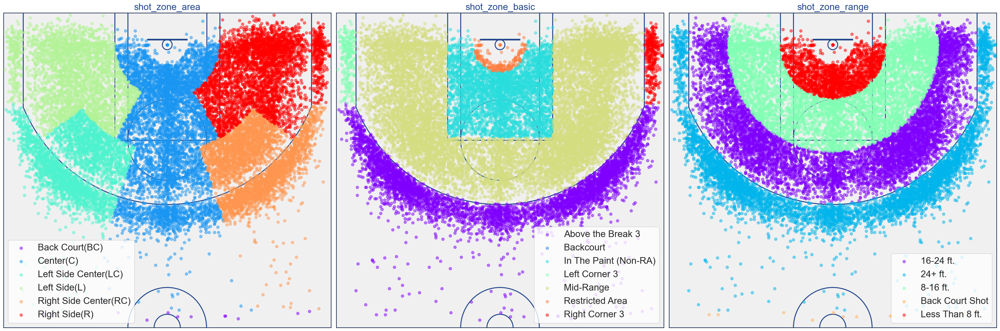

In [158]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.cm as cm
def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

def scatter_plot_by_category(ax, feat):
    alpha = 0.5
    gs = df.groupby(feat)
    cs = cm.rainbow(np.linspace(0, 1, len(gs)))
    for g, c in zip(gs, cs):
        ax.scatter(g[1].loc_x, g[1].loc_y, color=c, alpha=alpha, label=g[0])
    ax.legend(fontsize=20)

# 创建多个子图，每个子图展示一个投篮区域的分布
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# 绘制 shot_zone_area 的分布
draw_ball_field(axes[0], color='#20458C', lw=2)
scatter_plot_by_category(axes[0], 'shot_zone_area')
axes[0].set_xlim(-250, 250)
axes[0].set_ylim(422.5, -47.5)
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_title('shot_zone_area', fontsize=20, color='#20458C')

# 绘制 shot_zone_basic 的分布
draw_ball_field(axes[1], color='#20458C', lw=2)
scatter_plot_by_category(axes[1], 'shot_zone_basic')
axes[1].set_xlim(-250, 250)
axes[1].set_ylim(422.5, -47.5)
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_title('shot_zone_basic', fontsize=20, color='#20458C')

# 绘制 shot_zone_range 的分布
draw_ball_field(axes[2], color='#20458C', lw=2)
scatter_plot_by_category(axes[2], 'shot_zone_range')
axes[2].set_xlim(-250, 250)
axes[2].set_ylim(422.5, -47.5)
axes[2].set_xticks([])
axes[2].set_yticks([])
axes[2].set_title('shot_zone_range', fontsize=20, color='#20458C')

plt.tight_layout()
plt.show()

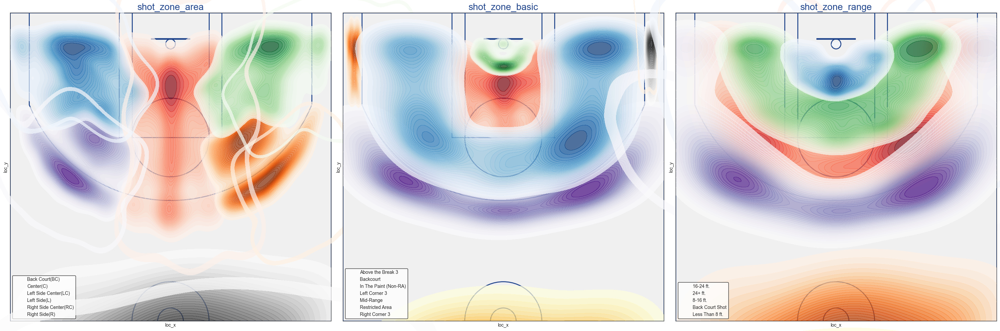

In [165]:
import matplotlib.pyplot as plt
from matplotlib.patches import Arc, Circle, Rectangle
import pandas as pd
import seaborn as sns
import numpy as np

# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')

def draw_ball_field(ax, color='#20458C', lw=2):
    """
    绘制篮球场
    """
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#F0F0F0', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

def kde_plot_by_category(ax, feat, color_map):
    gs = df.groupby(feat)
    for name, group in gs:
        if group['loc_x'].nunique() > 1 and group['loc_y'].nunique() > 1:
            sns.kdeplot(
                x=group['loc_x'], 
                y=group['loc_y'], 
                fill=True, 
                cmap=color_map[name], 
                thresh=0.05, 
                alpha=0.7, 
                levels=30,
                ax=ax,
                label=name
            )
    ax.legend(frameon=True, facecolor='white', edgecolor='black')

# 定义颜色映射
color_maps = {
    'shot_zone_area': {
        'Left Side(L)': 'Blues',
        'Right Side(R)': 'Greens',
        'Center(C)': 'Reds',
        'Left Side Center(LC)': 'Purples',
        'Right Side Center(RC)': 'Oranges',
        'Back Court(BC)': 'Greys'  # 确保包含 'Back Court(BC)'
    },
    'shot_zone_basic': {
        'Mid-Range': 'Blues',
        'Restricted Area': 'Greens',
        'In The Paint (Non-RA)': 'Reds',
        'Above the Break 3': 'Purples',
        'Left Corner 3': 'Oranges',
        'Right Corner 3': 'Greys',
        'Backcourt': 'YlOrBr'  # 添加 'Backcourt'
    },
    'shot_zone_range': {
        'Less Than 8 ft.': 'Blues',
        '8-16 ft.': 'Greens',
        '16-24 ft.': 'Reds',
        '24+ ft.': 'Purples',
        'Back Court Shot': 'Oranges'
    }
}

# 创建多个子图，每个子图展示一个投篮区域的热力图分布
fig, axes = plt.subplots(1, 3, figsize=(30, 10))

# 绘制 shot_zone_area 的热力图分布
draw_ball_field(axes[0], color='#20458C', lw=2)
kde_plot_by_category(axes[0], 'shot_zone_area', color_maps['shot_zone_area'])
axes[0].set_xlim(-250, 250)
axes[0].set_ylim(422.5, -47.5)
axes[0].set_xticks([])
axes[0].set_yticks([])
axes[0].set_title('shot_zone_area', fontsize=20, color='#20458C')

# 绘制 shot_zone_basic 的热力图分布
draw_ball_field(axes[1], color='#20458C', lw=2)
kde_plot_by_category(axes[1], 'shot_zone_basic', color_maps['shot_zone_basic'])
axes[1].set_xlim(-250, 250)
axes[1].set_ylim(422.5, -47.5)
axes[1].set_xticks([])
axes[1].set_yticks([])
axes[1].set_title('shot_zone_basic', fontsize=20, color='#20458C')

# 绘制 shot_zone_range 的热力图分布
draw_ball_field(axes[2], color='#20458C', lw=2)
kde_plot_by_category(axes[2], 'shot_zone_range', color_maps['shot_zone_range'])
axes[2].set_xlim(-250, 250)
axes[2].set_ylim(422.5, -47.5)
axes[2].set_xticks([])
axes[2].set_yticks([])
axes[2].set_title('shot_zone_range', fontsize=20, color='#20458C')
plt.tight_layout()
plt.show()


##### 统计时间进球的关系

###### 统计时间与jumpshot进球的关系

In [207]:
import pandas as pd
import matplotlib.pyplot as plt
# 读取数据
df = pd.read_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/投篮方式分布/jumpshotana/jumpshot.csv')
# 统计每个赛季的进球数和未进球数
season_stats = df.groupby(['season', 'shot_made_flag']).size().unstack().fillna(0)
season_stats.columns = ['Missed', 'Made']
# 计算每个赛季的进球率（accuracy）
season_stats['Acc'] = season_stats['Made'] / (season_stats['Made'] + season_stats['Missed'])
season_stats.to_csv('/Users/maxingan/Documents/数据可视化期末大作业/期末大作业/image/时间与进球的关系/timeseason.csv')

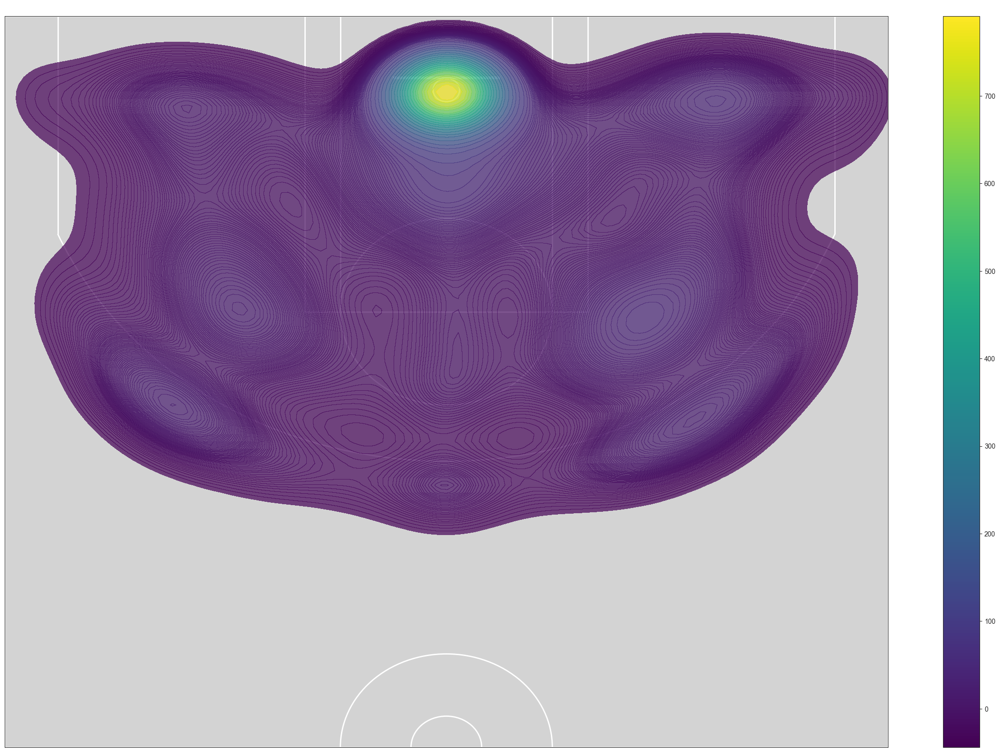

In [99]:
def draw_ball_field(ax, color='white', lw=2):
    """
    绘制篮球场
    """
    # 对篮球场进行底色填充
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color='#D3D3D3', fill=True)
    lines_outer_rec.set_zorder(0)
    ax.add_patch(lines_outer_rec)

    # 绘制篮筐,半径为7.5
    circle_ball = Circle(xy=(0, 0), radius=7.5, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_ball)

    # 绘制篮板,尺寸为(60,1)
    plate = Rectangle(xy=(-30, -7.5), width=60, height=-1, linewidth=lw, color=color, fill=False)
    ax.add_patch(plate)

    # 绘制2分区的外框线,尺寸为(160,190)
    outer_rec = Rectangle(xy=(-80, -47.5), width=160, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(outer_rec)

    # 绘制2分区的内框线,尺寸为(120,190)
    inner_rec = Rectangle(xy=(-60, -47.5), width=120, height=190, linewidth=lw, color=color, fill=False)
    ax.add_patch(inner_rec)

    # 绘制罚球区域圆圈,半径为60
    circle_punish = Circle(xy=(0, 142.5), radius=60, linewidth=lw, color=color, fill=False)
    ax.add_patch(circle_punish)

    # 绘制三分线的左边线
    three_left_rec = Rectangle(xy=(-220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_left_rec)

    # 绘制三分线的右边线
    three_right_rec = Rectangle(xy=(220, -47.5), width=0, height=140, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_right_rec)

    # 绘制三分线的圆弧,圆心为(0,0),半径为238.66,起始角度为22.8,结束角度为157.2
    three_arc = Arc(xy=(0, 0), width=477.32, height=477.32, theta1=22.8, theta2=157.2, linewidth=lw, color=color, fill=False)
    ax.add_patch(three_arc)

    # 绘制中场处的外半圆,半径为60
    center_outer_arc = Arc(xy=(0, 422.5), width=120, height=120, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_outer_arc)

    # 绘制中场处的内半圆,半径为20
    center_inner_arc = Arc(xy=(0, 422.5), width=40, height=40, theta1=180, theta2=0, linewidth=lw, color=color, fill=False)
    ax.add_patch(center_inner_arc)

    # 绘制篮球场外框线,尺寸为(500,470)
    lines_outer_rec = Rectangle(xy=(-250, -47.5), width=500, height=470, linewidth=lw, color=color, fill=False)
    ax.add_patch(lines_outer_rec)

# 创建图形和轴
fig, ax = plt.subplots(figsize=(30, 20))

# 绘制篮球场
draw_ball_field(ax, color='white', lw=2)

# 设置坐标轴范围
ax.set_xlim(-250, 250)
ax.set_ylim(422.5, -47.5)

# 消除坐标轴刻度
ax.set_xticks([])
ax.set_yticks([])

# 绘制投篮热力图，并添加颜色条
kde = sns.kdeplot(
    x=df['loc_x'], 
    y=df['loc_y'], 
    fill=True, 
    cmap='viridis',  # 使用'coolwarm'色彩映射
    thresh=0.05, 
    alpha=0.7, 
    levels=100,
    ax=ax
)

# 添加颜色条
norm = plt.Normalize(df['loc_y'].min(), df['loc_y'].max())
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
fig.colorbar(sm, ax=ax)

# 绘制投篮散点图
# ax.scatter(x=df['loc_x'], y=df['loc_y'], s=5, color='white', alpha=0.3)

# 添加标题
ax.set_title('Kobe Bryant Shot Chart Heatmap', fontsize=16, color='white')

# 设置背景颜色
ax.set_facecolor('#4A4A4A')

# 显示图像
plt.show()